## Mathematical Modelling with Malaria

https://malariajournal.biomedcentral.com/articles/10.1186/1475-2875-10-202#ref-CR95

#### Step 1: Formatting the Data

The data was given to me in a time series format, with 11 years of monthly malaria data in Afghanistan. In order to observe the seasonal malaria patterns, I have split the larger dataframe into 10 smaller dataframes, which were split from one minimum malaria average (in a 12 month range) to the next minimum. This way, the seasonal patterns will be captured in each smaller dataframe, and the seasons can be compared.

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("malaria_time_series.csv")

In [4]:
pop = pd.read_csv("afghan_pop.csv")

In [5]:
pop.head(1)

,Year,Population,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,2020.0,"38,928,346",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.year.unique()

array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15], dtype=int64)

In [7]:
#this line of code finds the minimum value in the malaria_avg column within the specified range

df.malaria_avg[0:12].min()

89

In [8]:
# this line of code returns the index at which the minimum found above is located

df.malaria_avg[0:12].idxmin()

1

In [9]:
# loop that locates the minimum value every 12 months... minimum to minimum is one malaria season

i=0
for x in range(200):
    print(df.malaria_avg[i:i+12].min(),"is the minimum at index: ", df.malaria_avg[i:i+12].idxmin())
    i+=12
    if i>129:
        break

89 is the minimum at index:  1
67 is the minimum at index:  13
53 is the minimum at index:  26
44 is the minimum at index:  37
28 is the minimum at index:  49
31 is the minimum at index:  61
27 is the minimum at index:  74
21 is the minimum at index:  85
16 is the minimum at index:  97
13 is the minimum at index:  109
14 is the minimum at index:  122


In [10]:
# create a list of the indeces

list_of_indeces = []
i=0
for x in range(200):
    index = df.malaria_avg[i:i+12].idxmin()
    i+=12
    list_of_indeces.append(index)
    if i>129:
        break

In [11]:
list_of_indeces

[1, 13, 26, 37, 49, 61, 74, 85, 97, 109, 122]

In [12]:
# creates a list of dataframes split by the minimums in the list created above

dfs=[]
last_check=0
for ind in list_of_indeces:
    dfs.append(df.loc[last_check:ind-1])
    last_check = ind

In [13]:
dfs[9]

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity
97,13,98,13.166667,6365,3967843,16,87.29090,6.64895,0.097988,49.8449
98,13,99,13.250000,7676,3733942,21,65.22130,13.38090,0.139311,38.8483
99,13,100,13.333333,9349,3837789,24,68.13340,16.32610,0.168734,36.1655
100,13,101,13.416667,12940,4133034,31,5.80281,23.29840,0.175206,23.9503
101,13,102,13.500000,18236,4134372,44,12.05180,29.14770,0.164979,19.8007
102,13,103,13.583333,18578,4003829,46,2.02029,30.03310,0.152066,18.7558
103,13,104,13.666667,17131,3686847,46,14.07590,28.26010,0.142270,24.2926
104,13,105,13.750000,20250,4094413,49,2.37238,26.15880,0.134479,18.1780
105,13,106,13.833333,17049,3553991,48,14.53350,19.78230,0.126459,24.3324
106,13,107,13.916667,14557,3707134,39,23.10940,11.27590,0.113136,38.0001


In [14]:
dfs[1]

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity
1,5,2,5.166667,4344,488990,89,72.70540,3.14279,0.077294,56.0037
2,5,3,5.250000,7308,626303,117,65.02130,11.79850,0.133377,46.3421
3,5,4,5.333333,13522,837186,162,21.62660,17.73530,0.163307,30.1279
4,5,5,5.416667,22563,879596,257,36.91190,20.65520,0.172882,28.8096
5,5,6,5.500000,32798,995224,330,4.08935,27.35810,0.168353,23.5656
6,5,7,5.583333,34506,1020242,338,5.51288,29.76840,0.159738,19.9055
7,5,8,5.666667,36384,1027940,354,3.72197,28.28070,0.150845,19.9656
8,5,9,5.750000,35417,977653,362,2.12996,26.29780,0.141339,18.8810
9,5,10,5.833333,27634,920478,300,4.73756,19.75430,0.131152,20.6330
10,5,11,5.916667,17229,809149,213,14.57470,10.59120,0.122614,35.9913


In [15]:
dfs[2]

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity
13,6,14,6.166667,7996,1196724,67,31.18440,10.48080,0.101799,43.6153
14,6,15,6.250000,9039,1210977,75,33.09130,12.71050,0.132759,37.6298
15,6,16,6.333333,13517,1278937,106,18.06440,18.78320,0.160820,27.6721
16,6,17,6.416667,24089,1374892,175,4.11571,26.68010,0.164121,20.8110
17,6,18,6.500000,35209,1397909,252,3.90447,27.63420,0.149351,17.3532
18,6,19,6.583333,35447,1325715,267,7.81615,30.05100,0.139122,19.3412
19,6,20,6.666667,36520,1369227,267,12.83860,28.56080,0.131045,19.4932
20,6,21,6.750000,39607,1289905,307,5.52551,24.02790,0.126541,18.8687
21,6,22,6.833333,29756,1182803,252,4.57407,21.15040,0.120144,24.3003
22,6,23,6.916667,21182,1135835,186,44.35970,11.46020,0.119159,40.1290


In [16]:
dfs[10]['m_fraction'] = dfs[10].apply(lambda row: row.malaria/34413603, axis=1)
dfs[10]

<ipython-input-16-3dc7314bad41>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[10]['m_fraction'] = dfs[10].apply(lambda row: row.malaria/34413603, axis=1)


,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity,m_fraction
109,14,110,14.166667,5250,3963725,13,53.82540,3.87985,0.085945,47.1340,0.000153
110,14,111,14.250000,5851,3755592,16,98.13140,10.62620,0.109316,42.4090,0.000170
111,14,112,14.333333,7296,3925830,19,35.99330,17.14600,0.140652,35.3470,0.000212
112,14,113,14.416667,12435,4366161,28,32.35380,21.90090,0.162256,29.7678,0.000361
113,14,114,14.500000,17372,4204440,41,6.76777,27.91570,0.160339,19.5819,0.000505
114,14,115,14.583333,19966,3987835,50,5.87432,29.88320,0.148854,17.9177,0.000580
115,14,116,14.666667,20422,3864955,53,5.26406,28.13650,0.138022,17.8050,0.000593
116,14,117,14.750000,29661,4251982,70,9.09417,25.92870,0.128837,17.6482,0.000862
117,14,118,14.833333,26727,3637637,73,32.21350,18.74480,0.123632,27.8082,0.000777
118,14,119,14.916667,22725,3958989,57,36.53550,10.27450,0.114950,36.7110,0.000660


Populating the interactive namespace from numpy and matplotlib


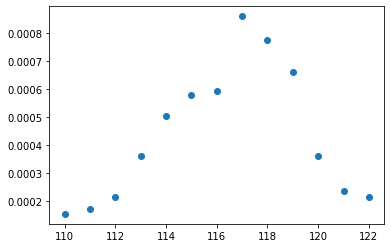

In [17]:
%pylab inline

x = dfs[10]["month"]
y = dfs[10]["m_fraction"]

plot(x,y, 'o')

In [18]:
dfs[9]

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity
97,13,98,13.166667,6365,3967843,16,87.29090,6.64895,0.097988,49.8449
98,13,99,13.250000,7676,3733942,21,65.22130,13.38090,0.139311,38.8483
99,13,100,13.333333,9349,3837789,24,68.13340,16.32610,0.168734,36.1655
100,13,101,13.416667,12940,4133034,31,5.80281,23.29840,0.175206,23.9503
101,13,102,13.500000,18236,4134372,44,12.05180,29.14770,0.164979,19.8007
102,13,103,13.583333,18578,4003829,46,2.02029,30.03310,0.152066,18.7558
103,13,104,13.666667,17131,3686847,46,14.07590,28.26010,0.142270,24.2926
104,13,105,13.750000,20250,4094413,49,2.37238,26.15880,0.134479,18.1780
105,13,106,13.833333,17049,3553991,48,14.53350,19.78230,0.126459,24.3324
106,13,107,13.916667,14557,3707134,39,23.10940,11.27590,0.113136,38.0001


In [19]:
for i in range (1,11):
    if i < 4:
        dfs[i]['m_fraction'] = dfs[i].apply(lambda row: row.malaria/25654277, axis=1)
    if (i >=4 and i < 9):
        dfs[i]['m_fraction'] = dfs[i].apply(lambda row: row.malaria/29185507, axis=1)
    if i>=9:
        dfs[i]['m_fraction'] = dfs[i].apply(lambda row: row.malaria/34413603, axis=1)


<ipython-input-19-1415e87b0507>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['m_fraction'] = dfs[i].apply(lambda row: row.malaria/25654277, axis=1)
<ipython-input-19-1415e87b0507>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['m_fraction'] = dfs[i].apply(lambda row: row.malaria/29185507, axis=1)
<ipython-input-19-1415e87b0507>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [20]:
dfs[9]

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity,m_fraction
97,13,98,13.166667,6365,3967843,16,87.29090,6.64895,0.097988,49.8449,0.000185
98,13,99,13.250000,7676,3733942,21,65.22130,13.38090,0.139311,38.8483,0.000223
99,13,100,13.333333,9349,3837789,24,68.13340,16.32610,0.168734,36.1655,0.000272
100,13,101,13.416667,12940,4133034,31,5.80281,23.29840,0.175206,23.9503,0.000376
101,13,102,13.500000,18236,4134372,44,12.05180,29.14770,0.164979,19.8007,0.000530
102,13,103,13.583333,18578,4003829,46,2.02029,30.03310,0.152066,18.7558,0.000540
103,13,104,13.666667,17131,3686847,46,14.07590,28.26010,0.142270,24.2926,0.000498
104,13,105,13.750000,20250,4094413,49,2.37238,26.15880,0.134479,18.1780,0.000588
105,13,106,13.833333,17049,3553991,48,14.53350,19.78230,0.126459,24.3324,0.000495
106,13,107,13.916667,14557,3707134,39,23.10940,11.27590,0.113136,38.0001,0.000423


In [21]:
dfs?

Type:        list
String form:
[   year  month      time  malaria  outpatient   malaria_avg  rain_avg  \
           0     5      1  5.08333 <...>
           120   6.36672  0.095918   42.8689    0.000236
           121   8.37621  0.045197   46.2553    0.000214  ]
Length:      11
Docstring:  
Built-in mutable sequence.

If no argument is given, the constructor creates a new empty list.
The argument must be an iterable if specified.


#### Step 2: Plotting the Data

Populating the interactive namespace from numpy and matplotlib


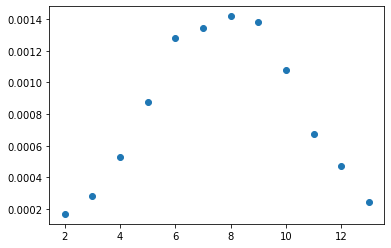

In [22]:
# plot data from season 1
%pylab inline
x = dfs[1].month
y = dfs[1].m_fraction

plot(x,y, 'o')

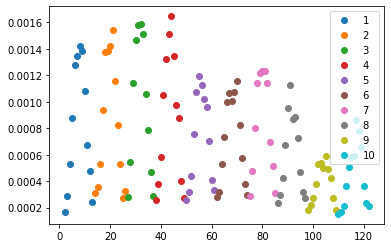

In [23]:
for i in range(1,11):
    
    x = dfs[i].month
    y = dfs[i].m_fraction

    plot(x,y, 'o', label = i )
    
    legend()

##### Calculating a "accumulation" column

In order to fit this data to the model, I will need an "accumulation" column for each of the seasons of malaria. This is because the model I am using models the total number of infected people over a one season period. 

In [24]:
dfs[1]["year"]

1     5
2     5
3     5
4     5
5     5
6     5
7     5
8     5
9     5
10    5
11    5
12    6
Name: year, dtype: int64

In [25]:
for i in range(1,10):
    accumulation_list=[]
    x=0
    for value in dfs[i]["malaria"]:
        x += value
        accumulation_list.append(x)
    dfs[i]["accumulation"]=accumulation_list

<ipython-input-25-9dd3e5bd8d3b>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]["accumulation"]=accumulation_list


In [26]:
df_2= dfs[2]
df_2.head()

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity,m_fraction,accumulation
13,6,14,6.166667,7996,1196724,67,31.18440,10.4808,0.101799,43.6153,0.000312,7996
14,6,15,6.250000,9039,1210977,75,33.09130,12.7105,0.132759,37.6298,0.000352,17035
15,6,16,6.333333,13517,1278937,106,18.06440,18.7832,0.160820,27.6721,0.000527,30552
16,6,17,6.416667,24089,1374892,175,4.11571,26.6801,0.164121,20.8110,0.000939,54641
17,6,18,6.500000,35209,1397909,252,3.90447,27.6342,0.149351,17.3532,0.001372,89850


Text(0.5, 1.0, 'Accumulated Cases of Malaria in Afghanistan')

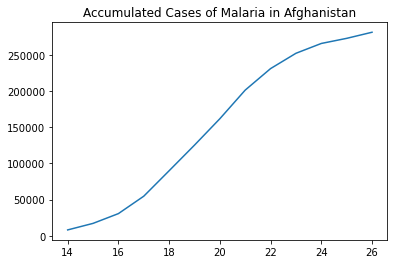

In [27]:
x=df_2.month
y=df_2.accumulation

plot(x,y)
title("Accumulated Cases of Malaria in Afghanistan")

#### Step 3: Parameter Exploration of the Models

#### Ross Model

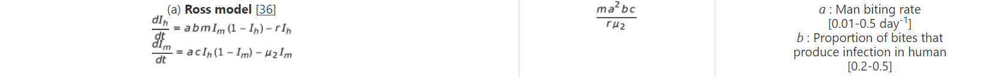

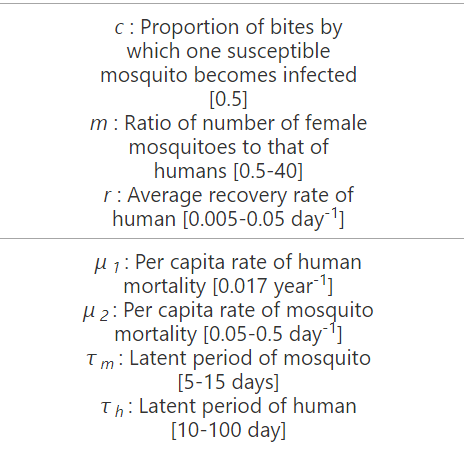

$$
dI_h/dt = a \cdot b \cdot m\cdot I_m \cdot (1-I_h) - r \cdot I_h
$$
$$
dI_m/dt =  a \cdot c \cdot I_h\cdot (1-I_m) - \mu_2 \cdot I_m
$$

In [28]:
from sci378 import *
from pyndamics3 import Simulation

Version:  0.0.13
pyndamics3  version  0.0.6


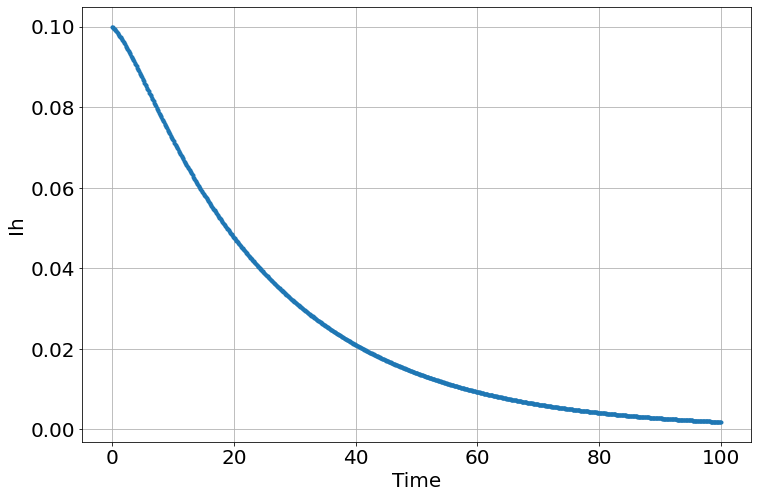

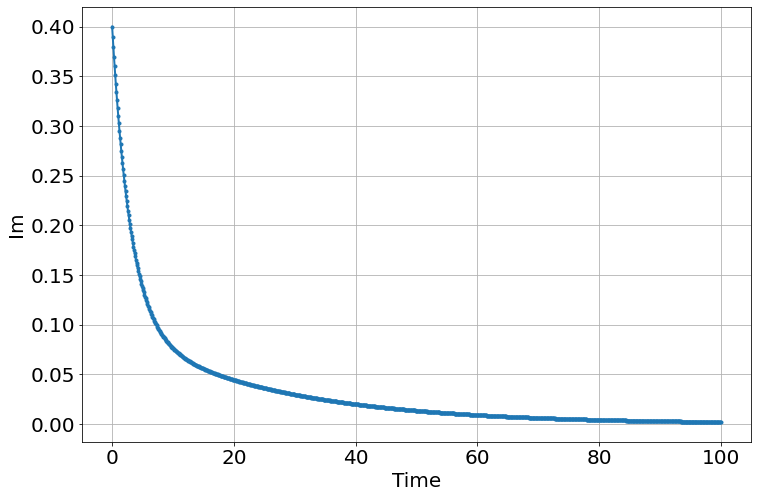

<Figure size 864x576 with 0 Axes>

In [28]:
sim = Simulation()
sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),.1,plot=True)
sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .4, plot=True)
sim.params(a=.5, b=.2, m=.100, r=.05, c=.500, μ2=.300)
sim.run(100)

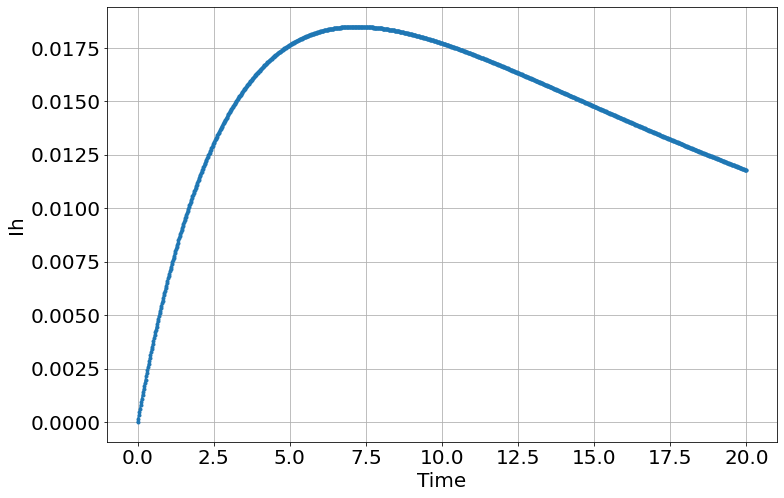

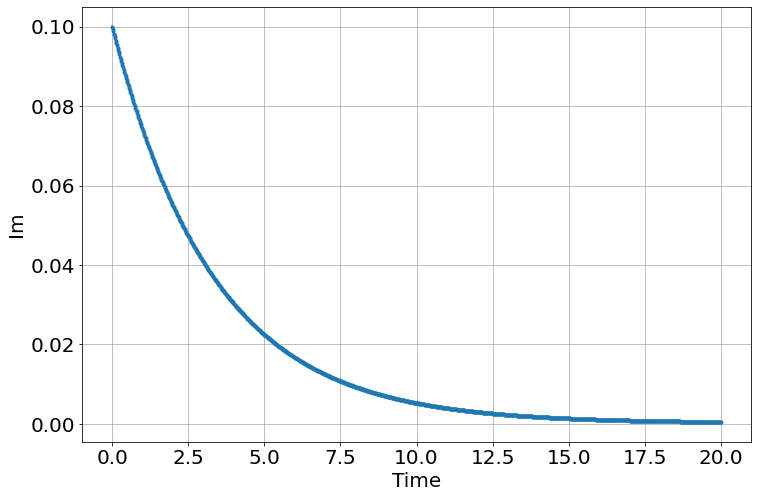

<Figure size 864x576 with 0 Axes>

In [29]:
# why does this happen when the initial value is not 0?

sim = Simulation()
sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=True)
sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"),.1, plot=True)
sim.params(a=.01, b=.2, m=40, r=.05, c=0.5, μ2=.3)
sim.run(20)

### Exploring the a parameter

The parameter a represents the Man biting rate. It can range from .01 to .5. As this value increases, we can expect to see an increase in the rate at which malaria cases rise in humans, as well as an increase in the size of the infected population. For the mosquito population, there are similar increases in the rate at which the mosquito population becomes infected and the size of the infected population. From some light research I believe this is because humans with malaria tranmit the disease to mosquitos as well. 

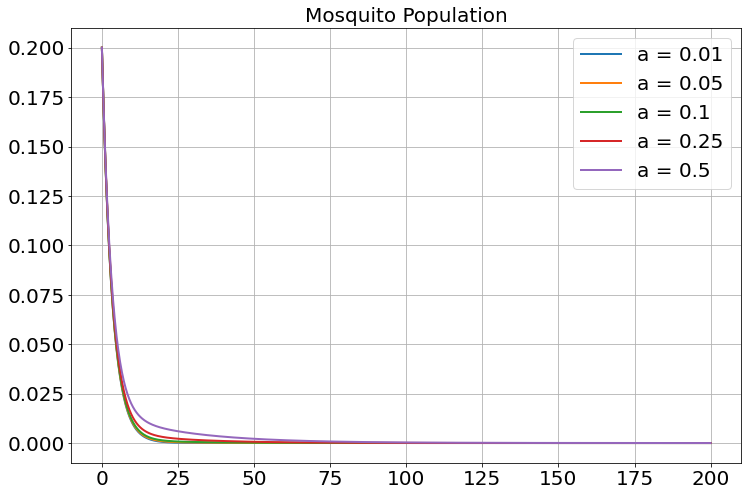

In [30]:
for a in [0.01, 0.05, 0.1, 0.25, 0.5]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),.01,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .2, plot=False)
    sim.params(a=a, b=0.2, m=.1, r=.05, c=0.5, μ2=.3)
    sim.run(200)
    
    #plot(sim.t, sim.Ih,'-',label=f'a = {a}')
    plot(sim.t, sim.Im,'-',label=f'a = {a}')
title("Mosquito Population")
legend()

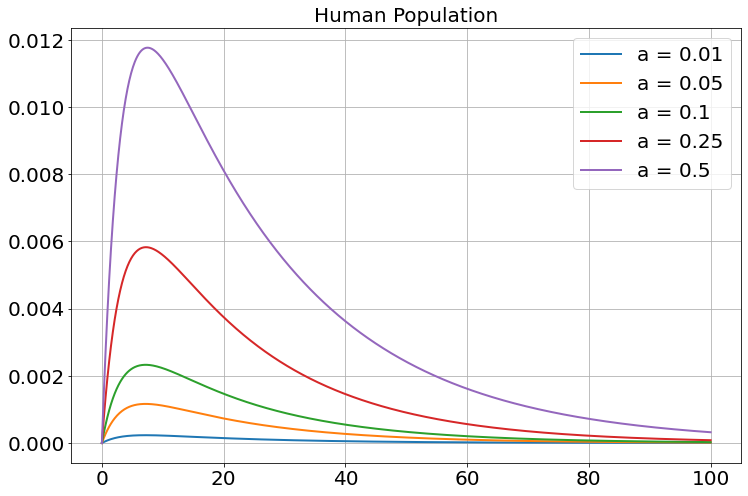

In [31]:
for a in [0.01, 0.05, 0.1, 0.25, 0.5]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .5, plot=False)
    sim.params(a=a, b=0.2, m=.1, r=.05, c=0.5, μ2=.3)
    sim.run(100)
    
    plot(sim.t, sim.Ih,'-',label=f'a = {a}')
    #plot(sim.t, sim.Im,'-',label=f'a = {a}')
title("Human Population")
legend()

### Exploring the r parameter

r is the average recovery rate of humans. It's value is said to be between 0.005 and 0.05, but I decided to explore values beyond this range as well. 

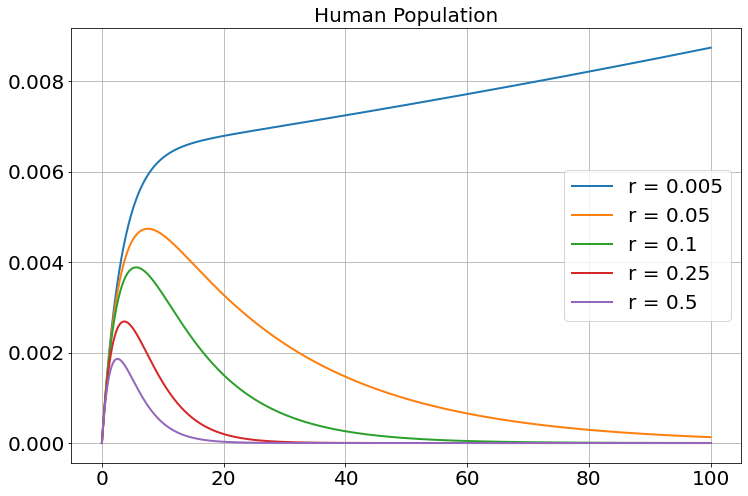

In [32]:
for r in [0.005, 0.05, 0.1, 0.25, 0.5]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .2, plot=False)
    sim.params(a=0.5, b=0.2, m=.1, r=r, c=0.5, μ2=.3)
    sim.run(100)
    
    plot(sim.t, sim.Ih,'-',label=f'r = {r}')
    #plot(sim.t, sim.Im,'-',label=f'a = {a}')
title("Human Population")
legend()

#### Exploring the $ μ_2 $ parameter

μ2 is the per capita rate of mosquito mortality, and ranges from 0.05 to 0.5.

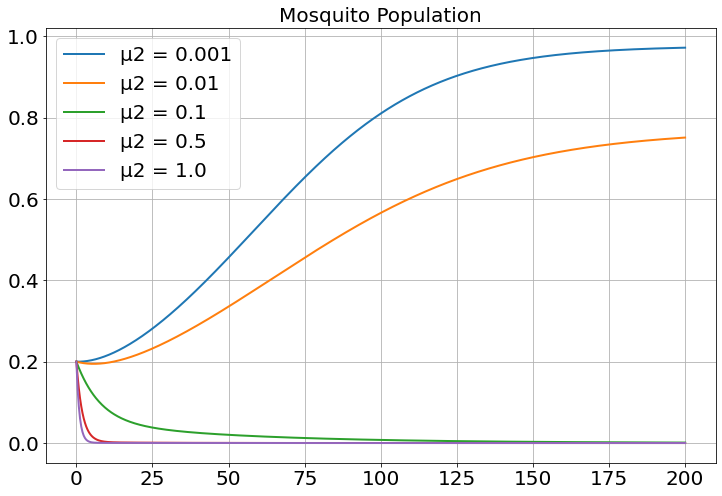

In [33]:
for μ2 in [0.001, 0.01, 0.1, 0.5, 1.0]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .2, plot=False)
    sim.params(a=0.5, b=0.2, m=.1, r=.05, c=0.5, μ2=μ2)
    sim.run(200)
    
    #plot(sim.t, sim.Ih,'-',label=f'a = {a}')
    plot(sim.t, sim.Im,'-',label=f'μ2 = {μ2}')
title("Mosquito Population")
legend()

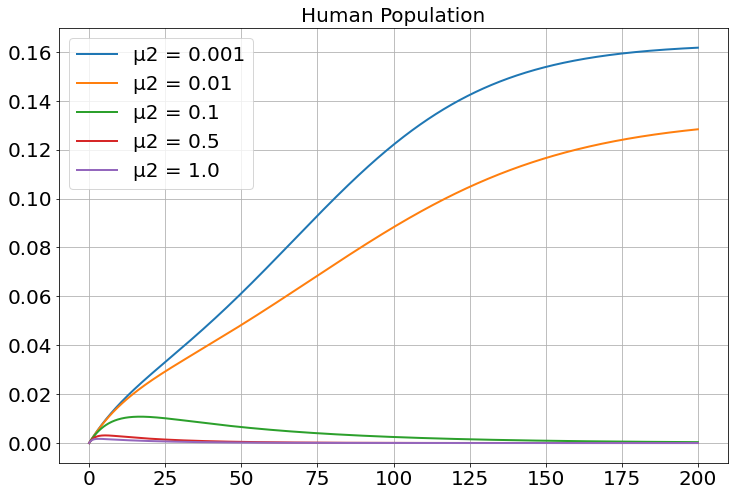

In [34]:
for μ2 in [0.001, 0.01, 0.1, 0.5, 1.0]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .2, plot=False)
    sim.params(a=0.5, b=0.2, m=.1, r=.05, c=0.5, μ2=μ2)
    sim.run(200)
    
    plot(sim.t, sim.Ih,'-',label=f'μ2 = {μ2}')
    #plot(sim.t, sim.Im,'-',label=f'μ2 = {μ2}')
title("Human Population")
legend()

#### How does the initial value of Im affect the human population?

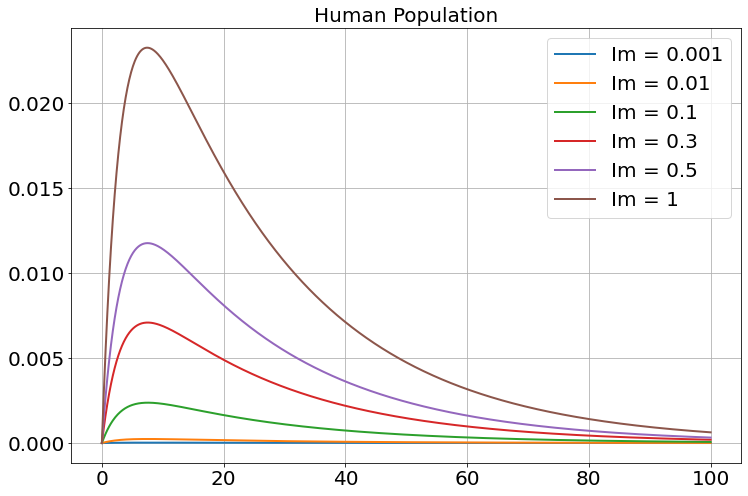

In [35]:
for Im in [0.001, 0.01, 0.1, 0.3, 0.5, 1]:
    sim = Simulation()
    sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0,plot=False)
    sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), Im, plot=False)
    sim.params(a=0.5, b=0.2, m=.1, r=0.05, c=0.5, μ2=.3)
    sim.run(100)
    
    plot(sim.t, sim.Ih,'-',label=f'Im = {Im}')
    #plot(sim.t, sim.Im,'-',label=f'a = {a}')
title("Human Population")
legend()

#### Step 4: Fitting the Data

In [29]:
from pyndamics3.fit import fit,Parameter

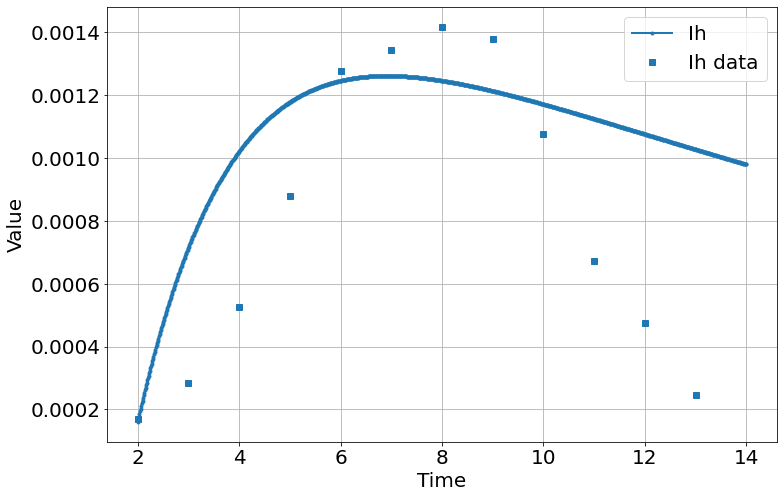

<Figure size 864x576 with 0 Axes>

In [38]:
x = dfs[1].month
y = dfs[1].m_fraction

sim = Simulation()
sim.add(("Ih'=a*b*m*Im*(1-Ih)-r*Ih"),0.00016,plot=True)
sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .01, plot=False)
sim.params(a=.7, b=.7, m=.15, r=.05, c=.0005, μ2=.5)
sim.add_data(t=x,Ih=y,plot=True)
sim.run(2,14)

In [39]:
x = dfs[1].month
y = dfs[1].m_fraction



results=fit(sim,
    Parameter("a",value=.1,min=0, max=1),
    Parameter("b",value=0.2,min=0, max=1),
    Parameter("m",value=0.1,min=0, max=40),
    Parameter("r",value=0.05,min=0, max=1), 
    Parameter("c",value=0.5,min=0, max=1), 
    Parameter("μ2",value=0.3,min=0, max=1),
           )

In [40]:
results

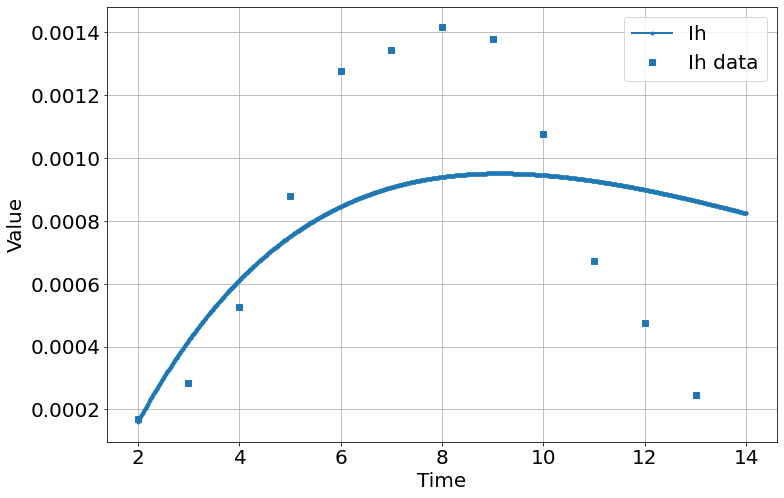

<Figure size 864x576 with 0 Axes>

In [41]:
sim.run(2, 14)

In [42]:
x = dfs[1].month
y = dfs[1].m_fraction



results=fit(sim,
    Parameter("a",value=.7,min=0, max=1),
    Parameter("b",value=0.7,min=0, max=1),
    Parameter("m",value=0.15,min=0, max=40),
    Parameter("r",value=0.05,min=0, max=1), 
    Parameter("c",value=0.0005,min=0, max=1), 
    Parameter("μ2",value=0.5,min=0, max=1),
           )

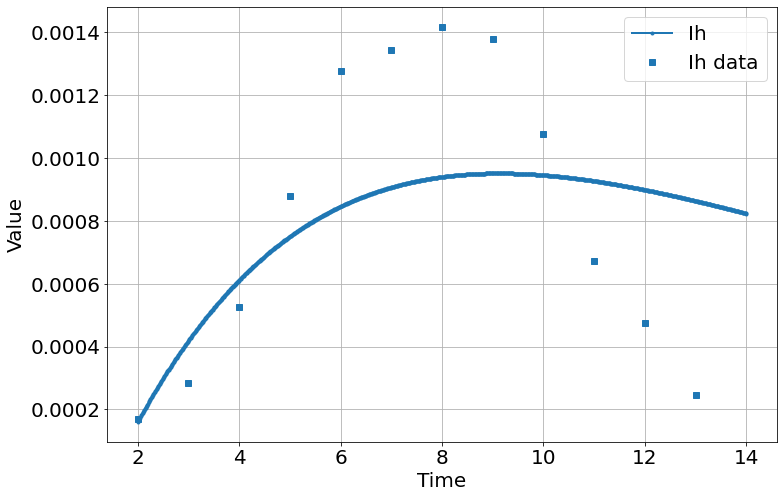

<Figure size 864x576 with 0 Axes>

In [43]:
sim.run(2, 14)

### Simplifying the Equation

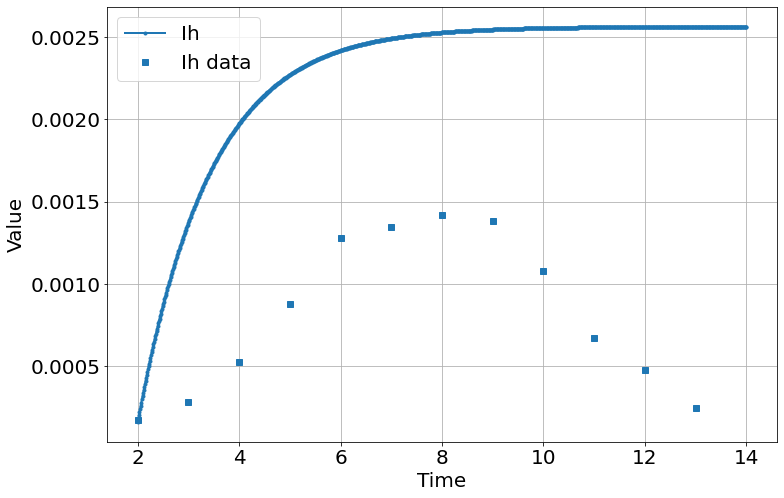

<Figure size 864x576 with 0 Axes>

In [151]:
x = dfs[1].month
y = dfs[1].m_fraction

# b = b*m
sim = Simulation()
sim.add(("Ih'=a*b*Im*(1-Ih)-r*Ih"),0.00016,plot=True)
sim.add(("Im'=a*c*Ih*(1-Im)-μ2*Im"), .2, plot=False)
sim.params(a=.01, b=.9, c=0.02, r=.7,  μ2=0)
sim.add_data(t=x,Ih=y,plot=True)
sim.run(2,14)

In [140]:
x = dfs[1].month
y = dfs[1].m_fraction


results=fit(sim,
    Parameter("a",value=.01,min=0, max=1),
    Parameter("b",value=0.6,min=0, max=1),
    Parameter("c", value=0.02, min=0, max=1),
    Parameter("r",value=0.3,min=0, max=1), 
    Parameter("μ2",value=0.4,min=0, max=1),
           )

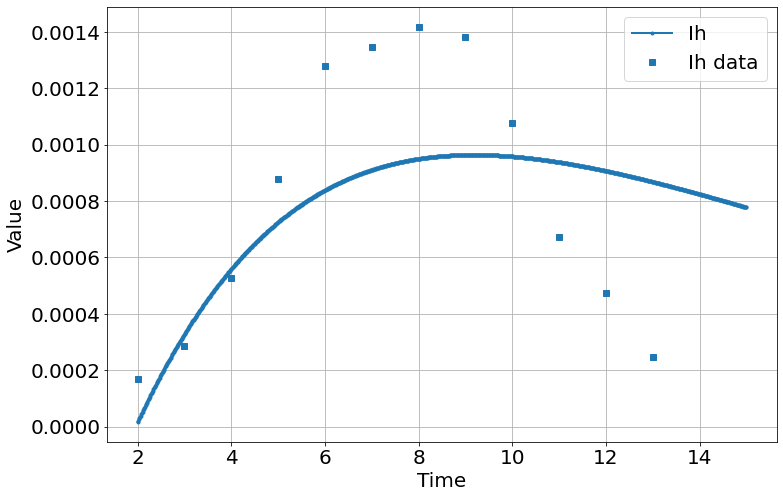

<Figure size 864x576 with 0 Axes>

In [141]:
sim.run(2,15)

In [30]:
from pyndamics3.mcmc import *

In [144]:
model=MCMCModel(sim,
               a=Uniform(0,.07),
               b=Uniform(0,.3),
               r=Uniform(0.3,1), 
               μ2=Uniform(0,0.75),
            initial_Ih=Uniform(0,.001),
            initial_Im=Uniform(0,0.2),
               )

Sampling Prior...
Done.
1.31 s
Running MCMC 1/8...
Done.
10 m, 13.13 s
Running MCMC 2/8...
Done.
10 m, 16.51 s
Running MCMC 3/8...
Done.
9 m, 58.54 s
Running MCMC 4/8...
Done.
9 m, 46.38 s
Running MCMC 5/8...
Done.
9 m, 43.08 s
Running MCMC 6/8...
Done.
9 m, 51.33 s
Running MCMC 7/8...
Done.
9 m, 41.83 s
Running MCMC 8/8...
Done.
9 m, 44.23 s


<Figure size 864x576 with 0 Axes>

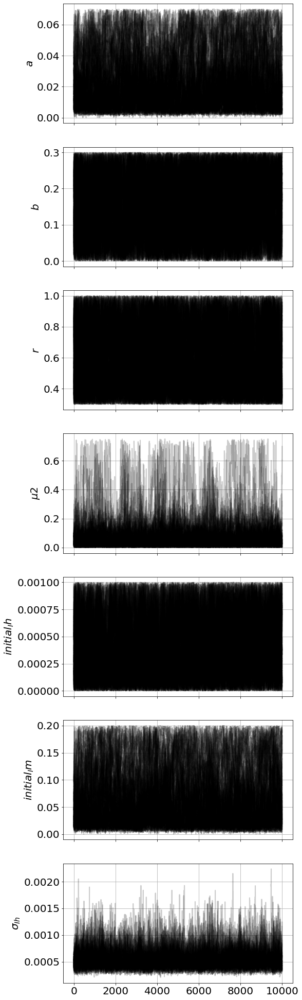

In [145]:
model.run_mcmc(10000,repeat=8)
model.plot_chains()

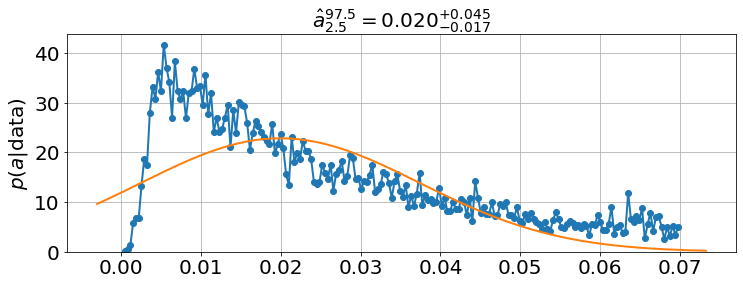

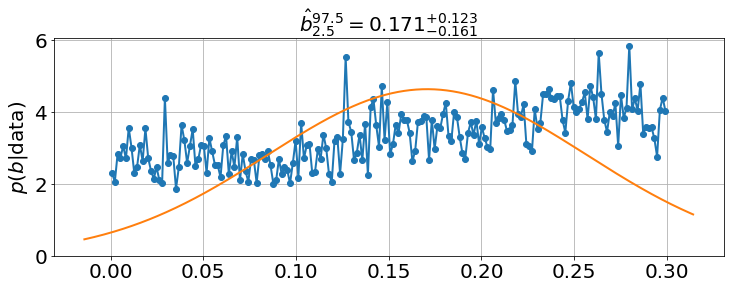

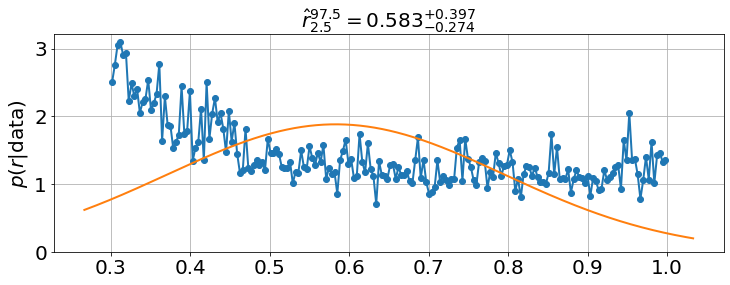

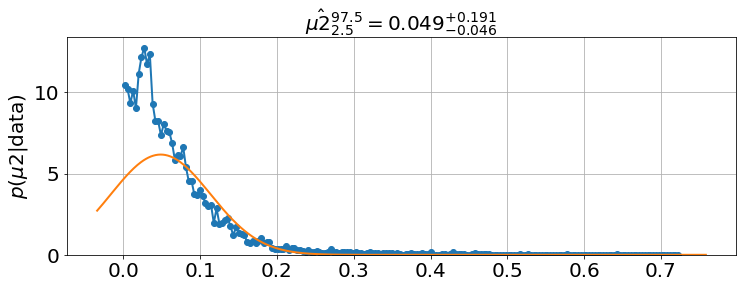

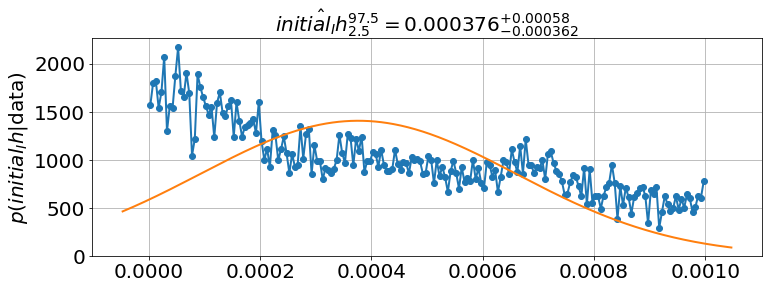

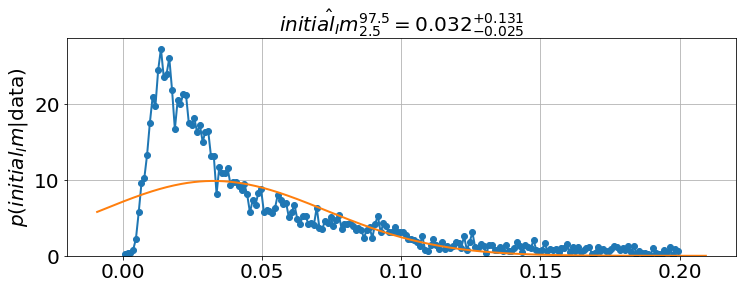

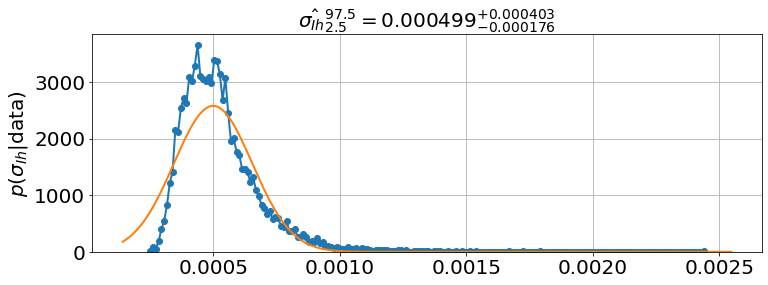

In [142]:
model.plot_distributions()


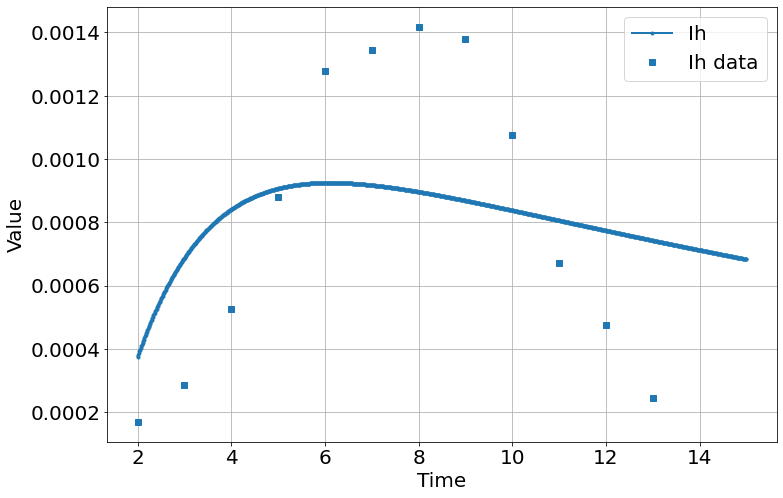

<Figure size 864x576 with 0 Axes>

In [143]:
sim.run(2,15)

In [144]:
from pyndamics3.mcmc import *

In [145]:
model=MCMCModel(sim,
               a=Uniform(0,1),
               b=Uniform(0,1),
                c=Uniform(0,1),
               r=Uniform(0,1), 
               μ2=Uniform(0,1),
            initial_Ih=Uniform(0,.001),
            initial_Im=Uniform(0,0.5),
               )

Sampling Prior...
Done.
1.78 s
Running MCMC 1/3...
Done.
59.26 s
Running MCMC 2/3...
Done.
52.42 s
Running MCMC 3/3...
Done.
1 m, 6.38 s


<Figure size 864x576 with 0 Axes>

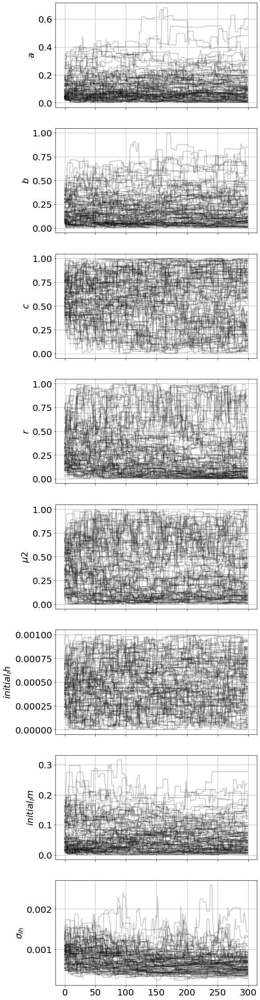

In [146]:
model.run_mcmc(300,repeat=3)
model.plot_chains()

# Simplify the Equation More
- c = 0.5
- b = b*m
- u2 = 0.017


 sim.params(a=0.5, b=0.2, m=.1, r=0.5, c=0.5, μ2=.3)

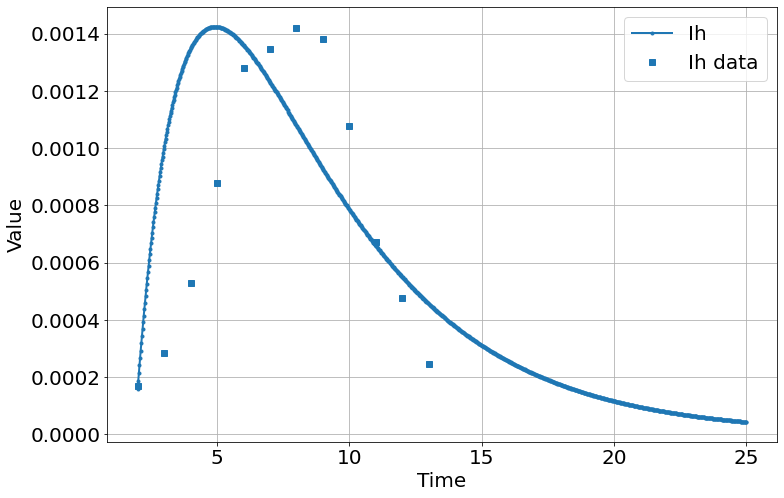

<Figure size 864x576 with 0 Axes>

In [227]:
x = dfs[1].month
y = dfs[1].m_fraction


sim = Simulation()
sim.add(("Ih'=a*4*Im*(1-Ih)-r*Ih"),0.00016,plot=True)
sim.add(("Im'=a*0.5*Ih*(1-Im)-0.2*Im"), .16, plot=False)
sim.params (r=.5, a=0.002)
sim.add_data(t=x,Ih=y,plot=True)
sim.run(2,25)

,year,month,time,malaria,outpatient,malaria_avg,rain_avg,temp_avg,veg_avg,humidity
124,15,125,15.416667,15980,4696745,34,29.65080,23.5064,0.108147,24.5561
125,15,126,15.500000,23190,4507568,51,5.60465,27.7105,0.105512,19.7861
126,15,127,15.583333,23912,3870979,62,11.64020,29.5790,0.099643,24.1505
127,15,128,15.666667,30866,4384686,70,10.27880,28.5566,0.094125,19.4401
128,15,129,15.750000,33883,3988962,85,17.57270,23.0729,0.086482,22.0050


In [169]:
len(dfs[1])

12

In [170]:
for i in range (1,11):
    the_list = []
    for x in range (1, len(dfs[i])+1):
        the_list.append(x)
    dfs[i]['index_col']= the_list

<ipython-input-170-ce9216a3be8b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs[i]['index_col']= the_list


Sampling Prior...
Done.
0.51 s
Running MCMC 1/3...
Done.
7.69 s
Running MCMC 2/3...
Done.
8.43 s
Running MCMC 3/3...
Done.
8.04 s


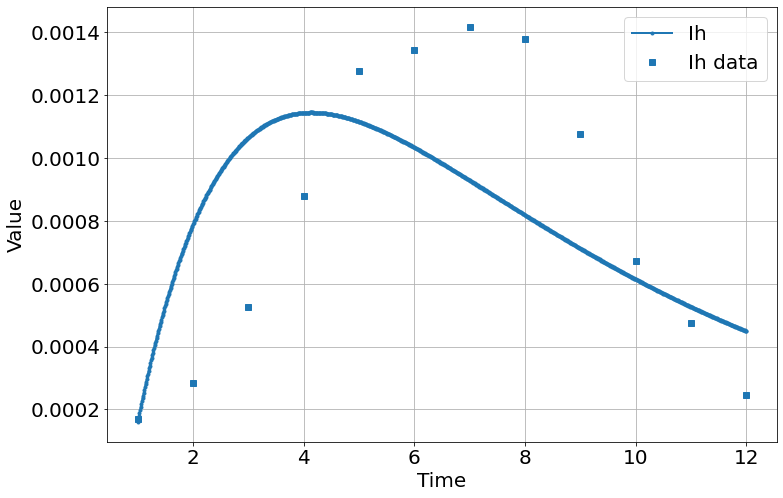

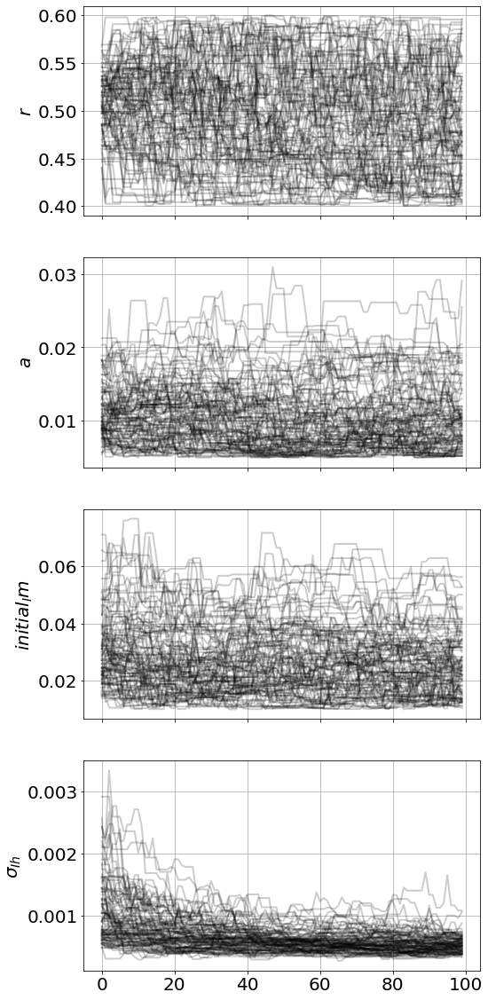

Sampling Prior...
Done.
0.48 s
Running MCMC 1/3...
Done.
8.76 s
Running MCMC 2/3...
Done.
11.44 s
Running MCMC 3/3...
Done.
7.76 s


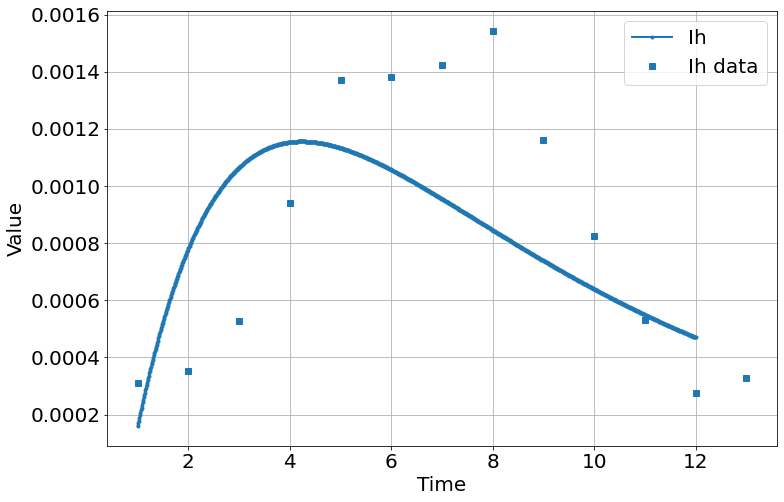

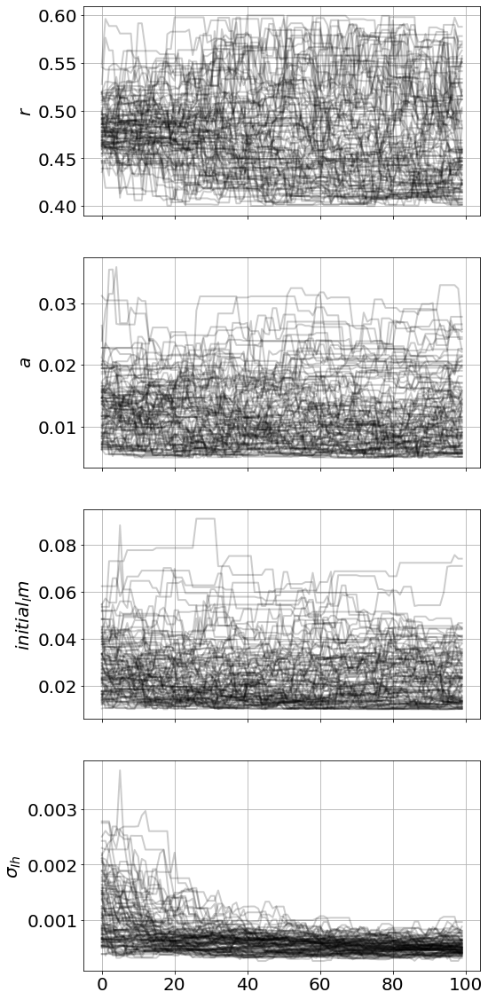

Sampling Prior...
Done.
0.48 s
Running MCMC 1/3...
Done.
7.89 s
Running MCMC 2/3...
Done.
9.22 s
Running MCMC 3/3...
Done.
8.59 s


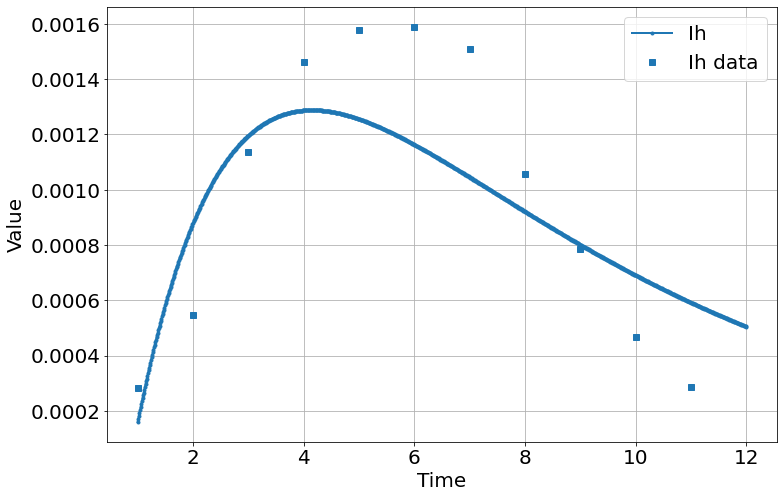

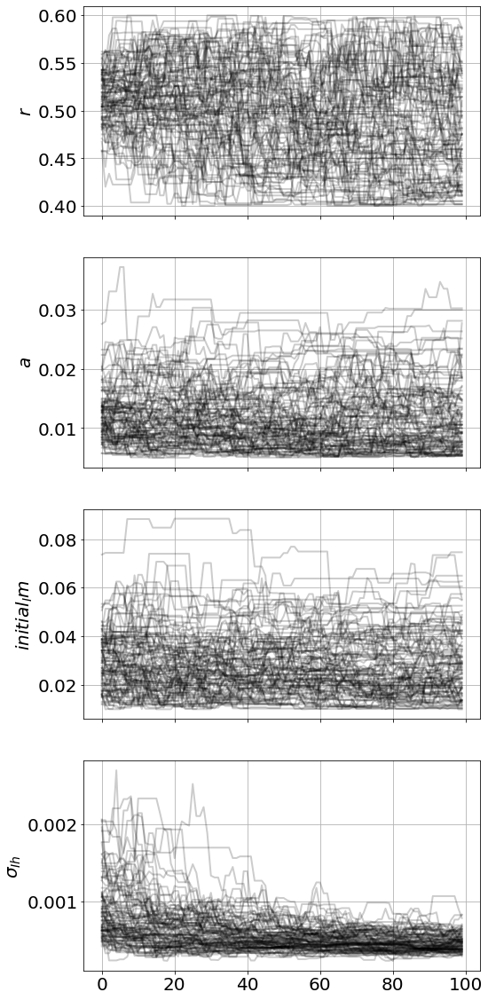

Sampling Prior...
Done.
1.01 s
Running MCMC 1/3...
Done.
9.70 s
Running MCMC 2/3...
Done.
8.93 s
Running MCMC 3/3...
Done.
7.94 s


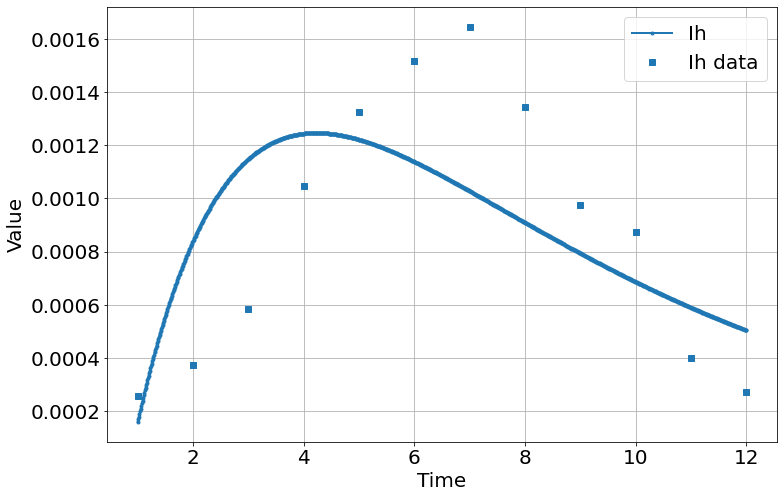

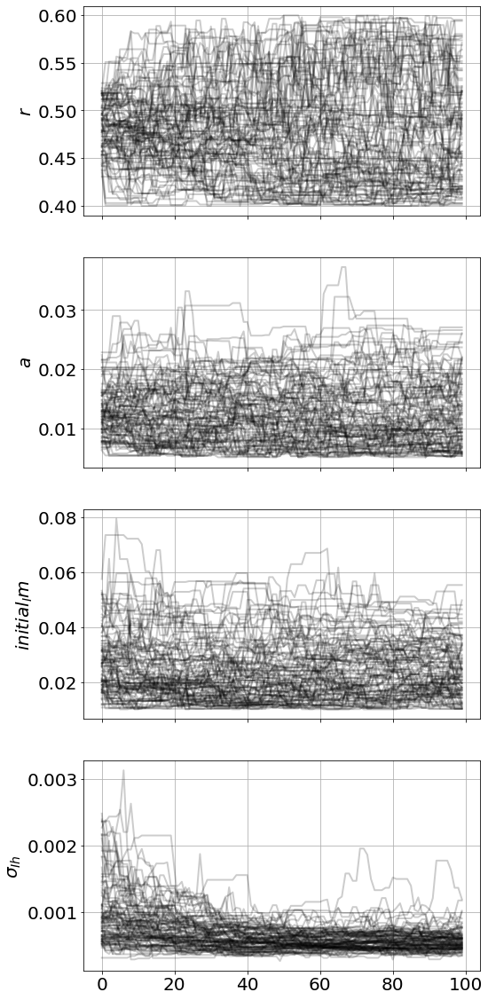

Sampling Prior...
Done.
0.52 s
Running MCMC 1/3...
Done.
8.63 s
Running MCMC 2/3...
Done.
8.05 s
Running MCMC 3/3...
Done.
8.16 s


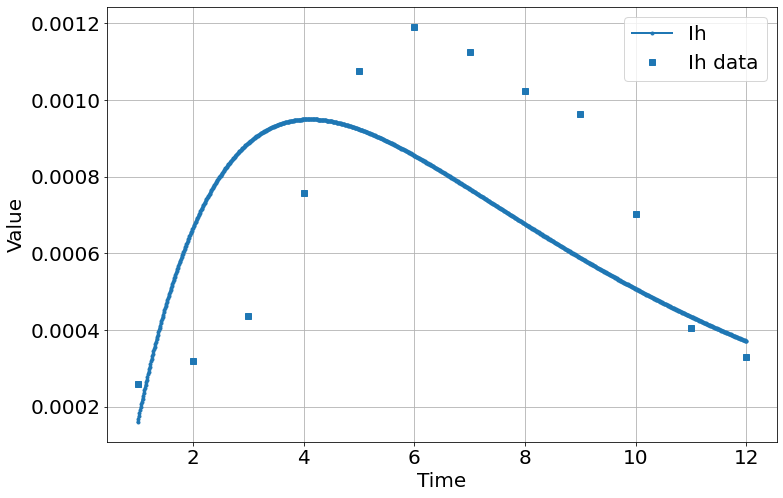

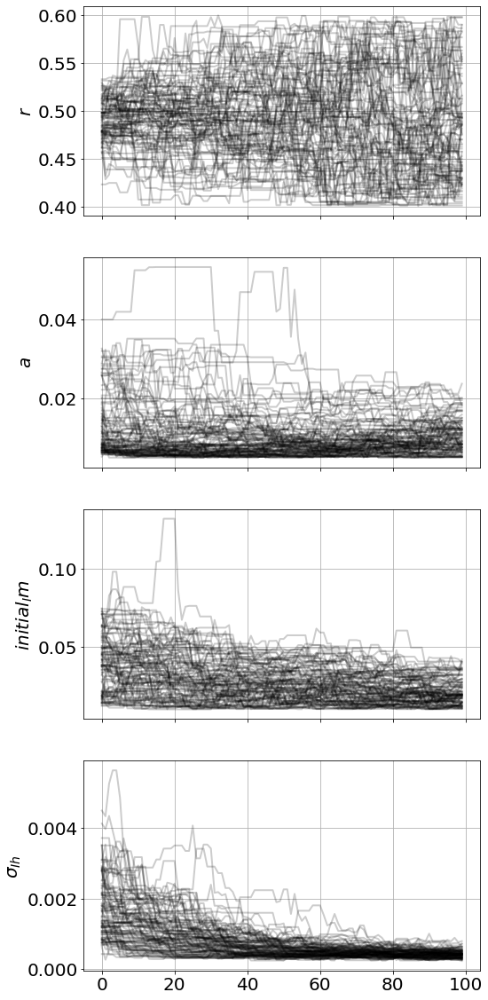

Sampling Prior...
Done.
0.52 s
Running MCMC 1/3...
Done.
8.33 s
Running MCMC 2/3...
Done.
7.69 s
Running MCMC 3/3...
Done.
7.37 s


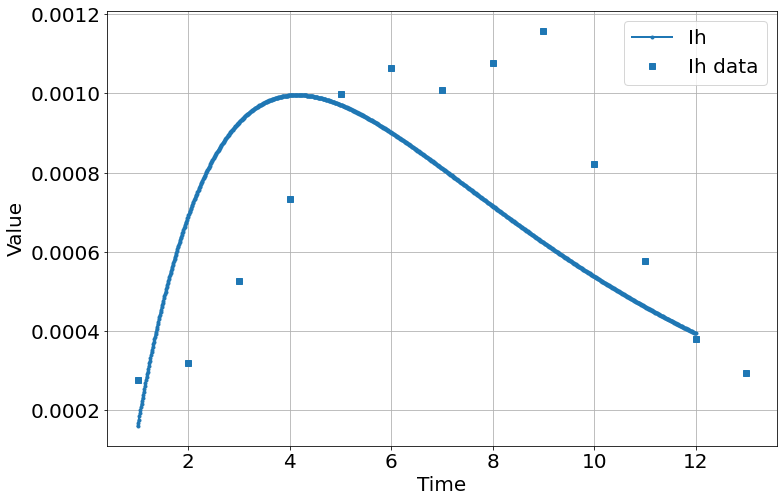

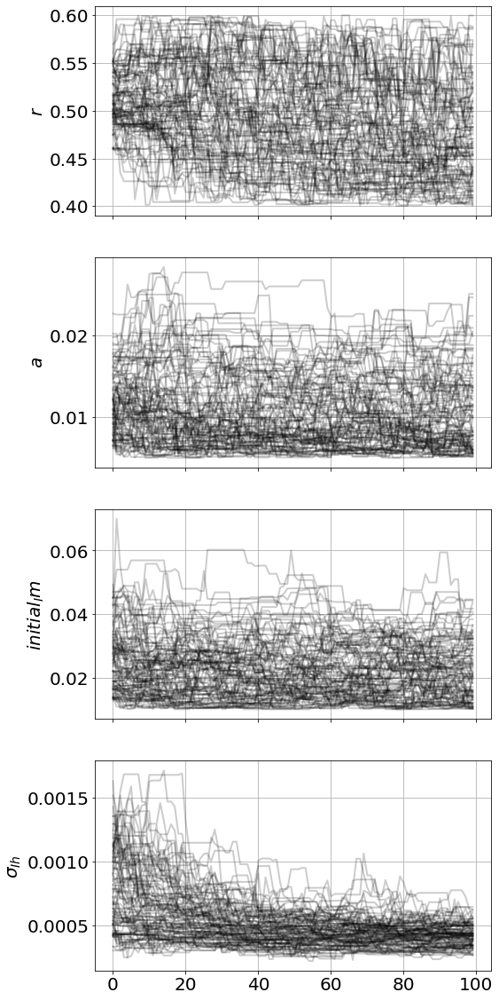

Sampling Prior...
Done.
0.49 s
Running MCMC 1/3...
Done.
7.45 s
Running MCMC 2/3...
Done.
7.32 s
Running MCMC 3/3...
Done.
10.67 s


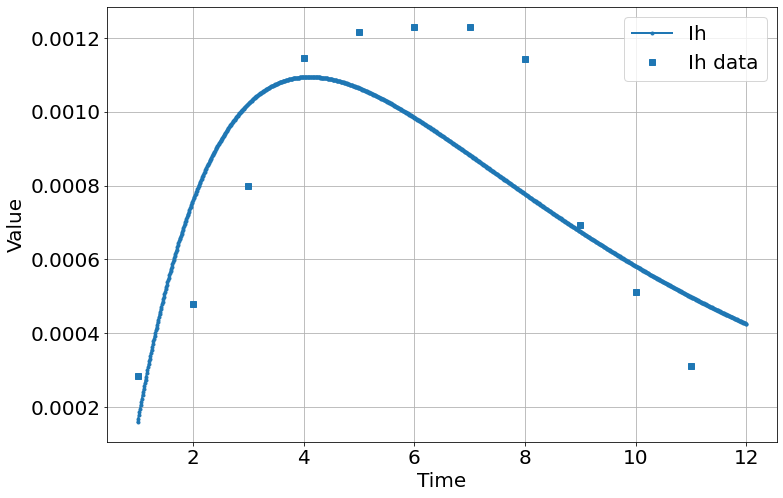

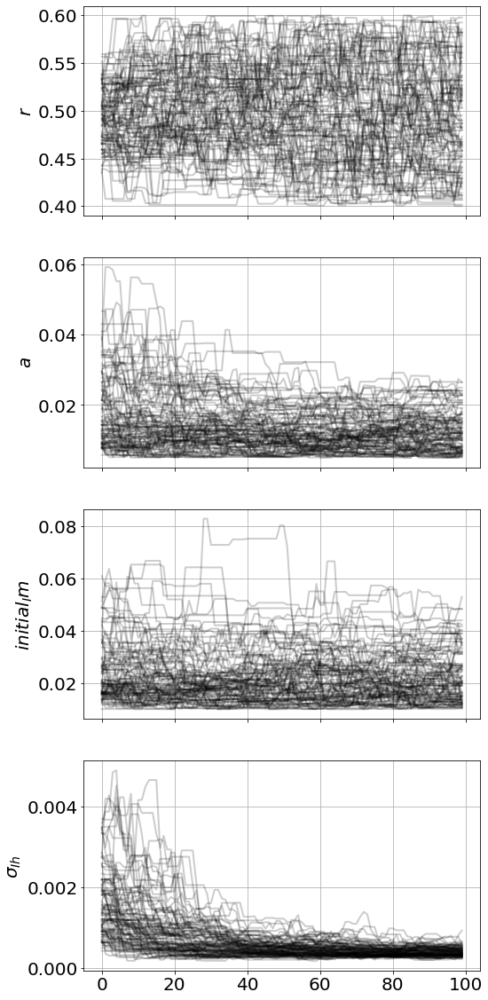

Sampling Prior...
Done.
0.56 s
Running MCMC 1/3...
Done.
11.15 s
Running MCMC 2/3...
Done.
10.47 s
Running MCMC 3/3...
Done.
8.55 s


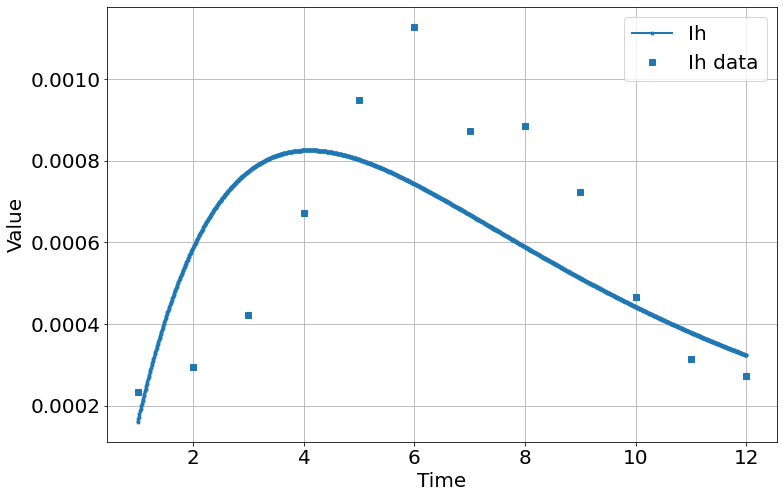

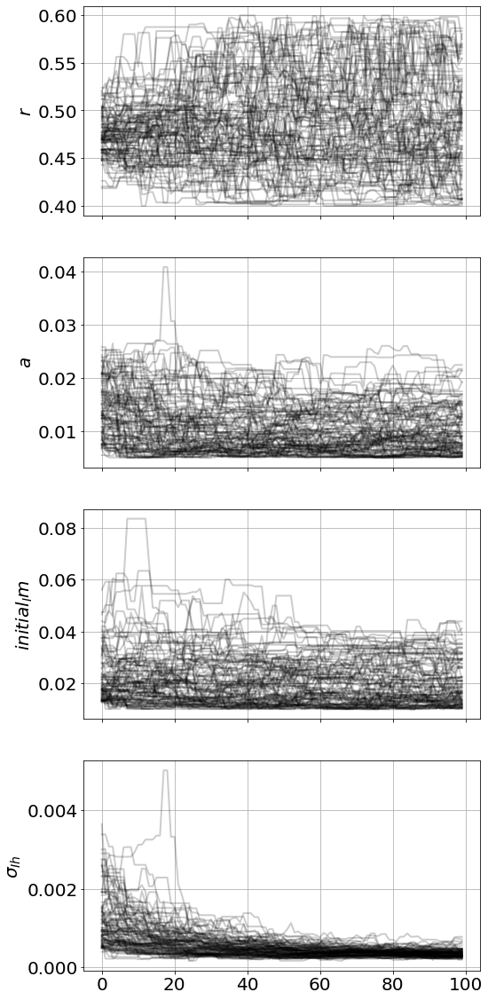

Sampling Prior...
Done.
0.49 s
Running MCMC 1/3...
Done.
11.03 s
Running MCMC 2/3...
Done.
9.98 s
Running MCMC 3/3...
Done.
9.80 s


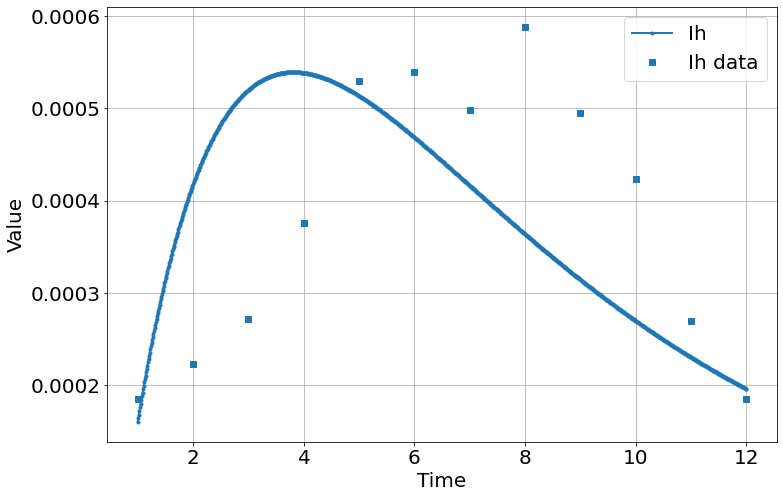

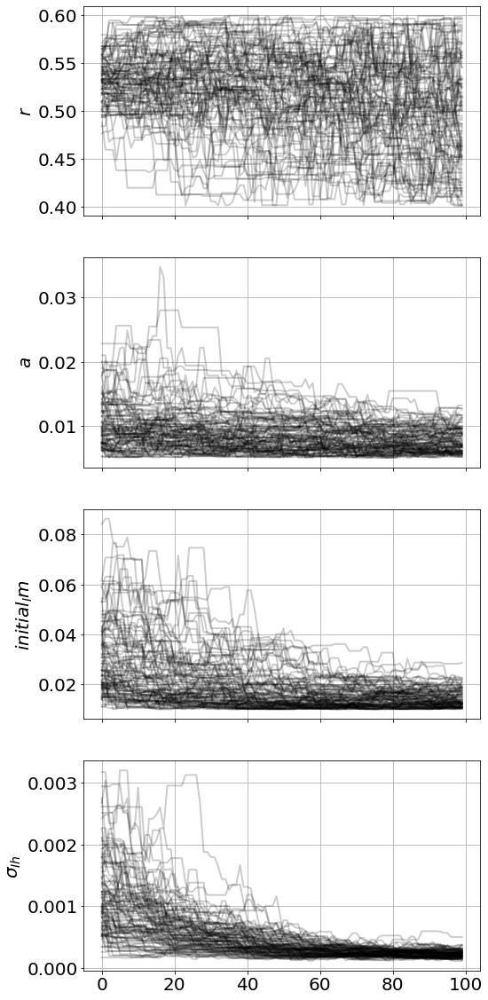

Sampling Prior...
Done.
0.50 s
Running MCMC 1/3...
Done.
7.84 s
Running MCMC 2/3...
Done.
7.71 s
Running MCMC 3/3...
Done.
7.66 s


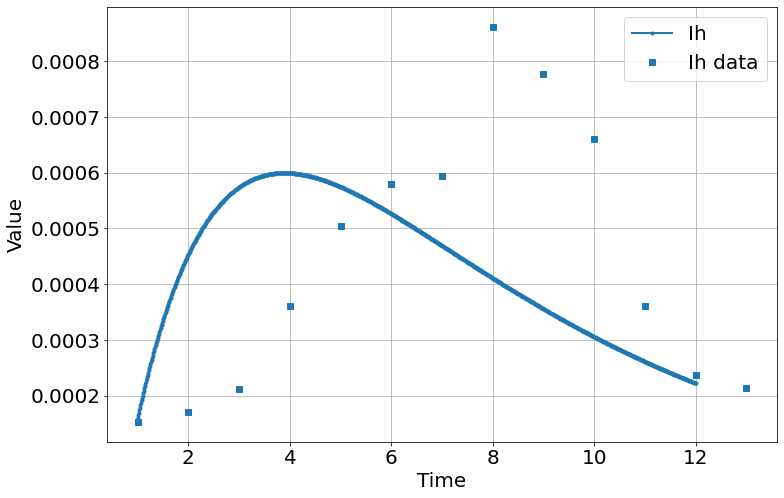

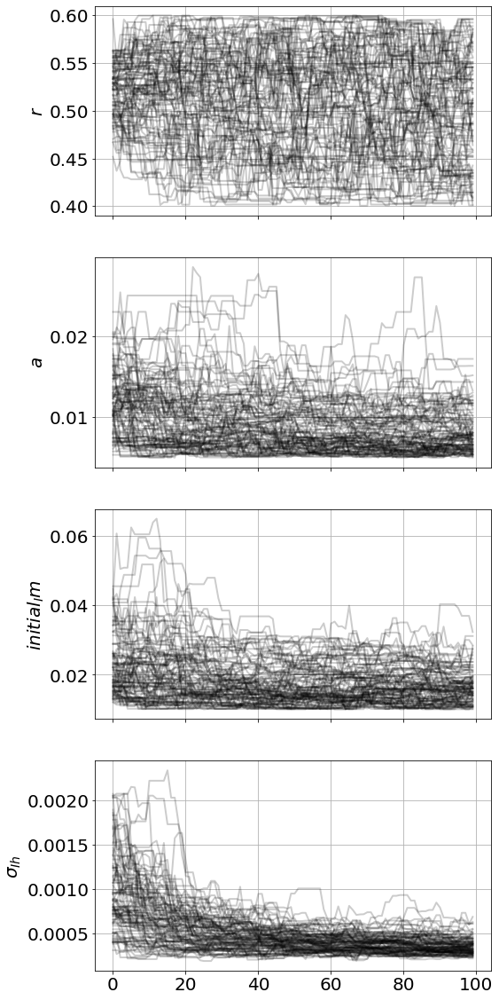

<Figure size 864x576 with 0 Axes>

In [173]:
for i in range(1,11):
    x = dfs[i].index_col
    y = dfs[i].m_fraction


    sim = Simulation()
    sim.add(("Ih'=a*4*Im*(1-Ih)-r*Ih"),0.00016,plot=True)
    sim.add(("Im'=a*0.5*Ih*(1-Im)-0.17*Im"), .15, plot=False)
    sim.params (r=.5, a=0.0021)
    sim.add_data(t=x,Ih=y,plot=True)
    model=MCMCModel(sim,
               r=Uniform(0.4, 0.6),
                a=Uniform(0.005, 0.1),
            initial_Im=Uniform(0.01,0.3),
               )
    model.run_mcmc(100,repeat=3)
    model.plot_chains()
    
    sim.run(1,12)
        

Sampling Prior...
Done.
0.51 s
Running MCMC 1/4...
Done.
35.29 s
Running MCMC 2/4...
Done.
34.12 s
Running MCMC 3/4...
Done.
40.59 s
Running MCMC 4/4...
Done.
34.70 s
Sampling Prior...
Done.
0.49 s
Running MCMC 1/4...
Done.
36.98 s
Running MCMC 2/4...
Done.
35.73 s
Running MCMC 3/4...
Done.
33.08 s
Running MCMC 4/4...
Done.
34.17 s


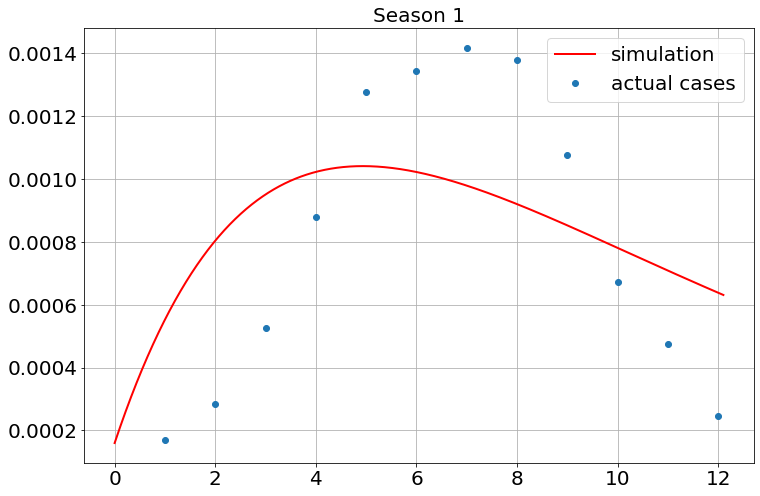

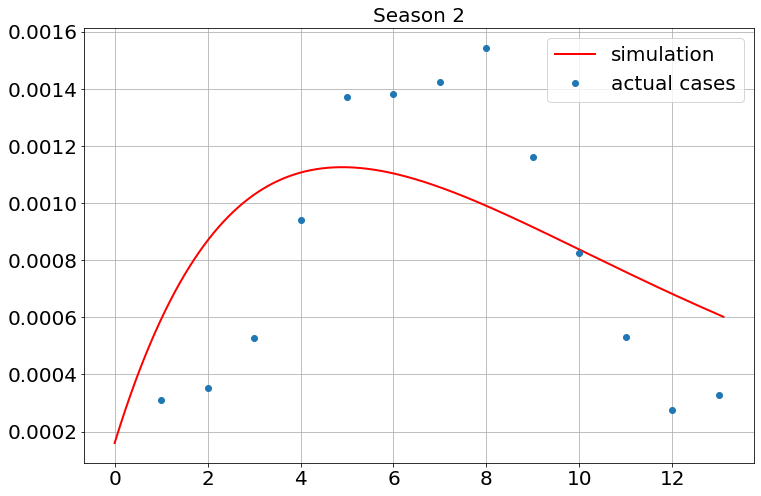

In [183]:
for i in range(1,3):
    x = dfs[i].index_col
    y = dfs[i].m_fraction


    sim = Simulation()
    sim.add(("Ih'=a*4*Im*(1-Ih)-r*Ih"),0.00016,plot=True)
    sim.add(("Im'=a*0.5*Ih*(1-Im)-0.17*Im"), .15, plot=False)
    sim.params (r=.5, a=0.0021)
    sim.add_data(t=x,Ih=y,plot=True)
    model=MCMCModel(sim,
               r=Uniform(0.1, 0.9),
                a=Uniform(0.001, 0.5),
            initial_Im=Uniform(0.007,0.5),
               )
    model.run_mcmc(500,repeat=4)
    #model.plot_chains()
    
    figure()
    plot(sim.t, sim.Ih, 'r',label='simulation')
    plot(x, y, 'o',label='actual cases')
    title(f'Season {i}')
    legend()
    

In [184]:
results=fit(sim,
    Parameter("a",value=.0021,min=0, max=.1),
    Parameter("r",value=0.5,min=0, max=.6), 
           )

In [129]:
results

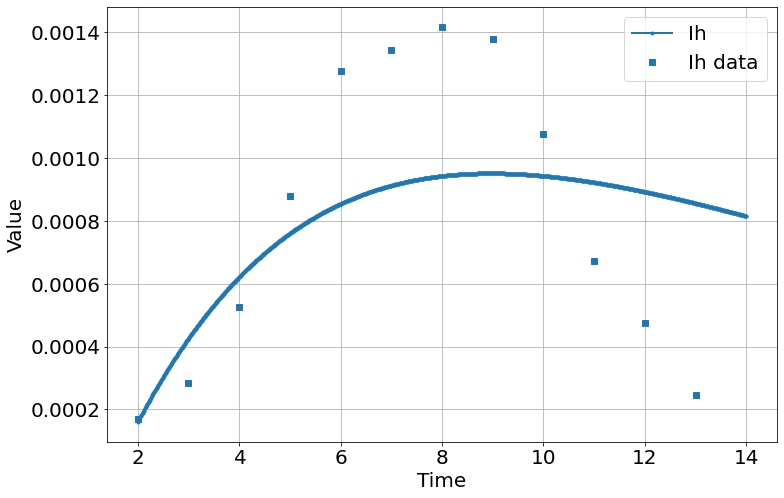

<Figure size 864x576 with 0 Axes>

In [130]:
sim.run(2,14)

In [96]:
model=MCMCModel(sim,
               r=Uniform(0.4, 0.6),
                a=Uniform(0.005, 0.1),
            initial_Im=Uniform(0.01,0.3),
               )

Sampling Prior...
Done.
0.98 s
Running MCMC 1/4...
Done.
1 m, 4.09 s
Running MCMC 2/4...
Done.
54.16 s
Running MCMC 3/4...
Done.
35.15 s
Running MCMC 4/4...
Done.
36.88 s


<Figure size 864x576 with 0 Axes>

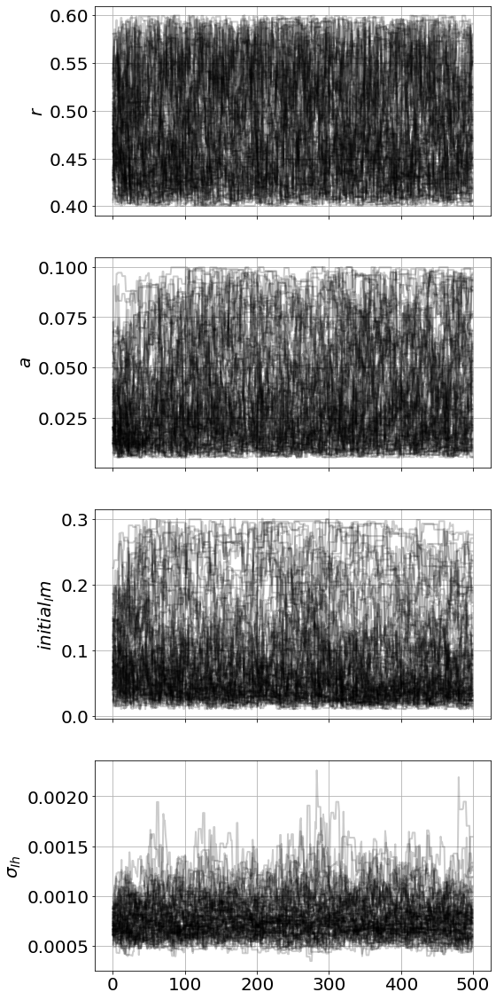

In [97]:
model.run_mcmc(500,repeat=4)
model.plot_chains()

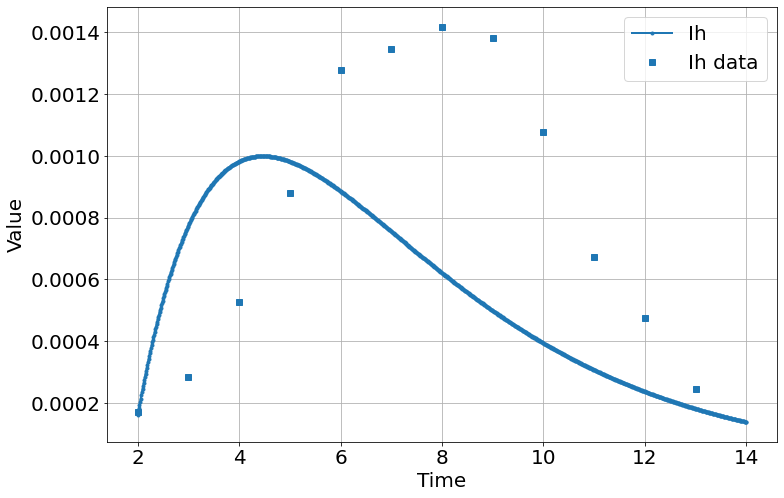

<Figure size 864x576 with 0 Axes>

In [98]:
sim.run(2,14)

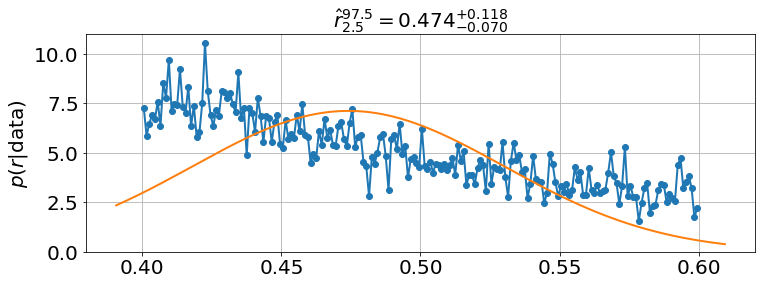

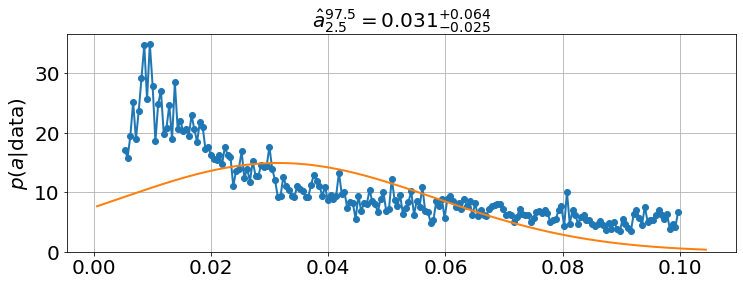

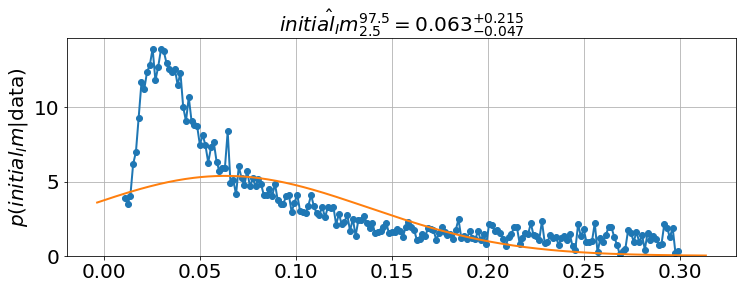

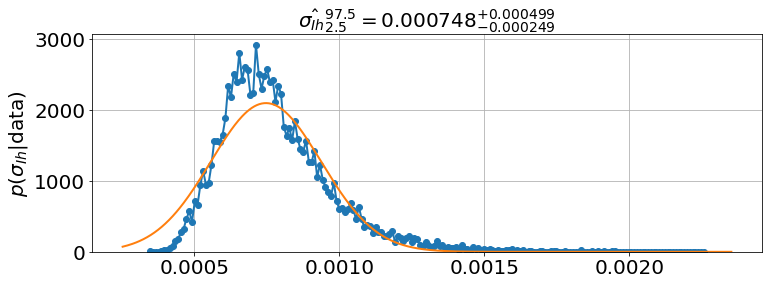

In [99]:
model.plot_distributions()

In [145]:
model=MCMCModel(sim,
               b=Uniform(1,40),
               r=Uniform(0.005,0.9), 
            initial_Im=Uniform(0,0.1),
               )

Sampling Prior...
Done.
1.01 s
Running MCMC 1/4...
Done.
13.08 s
Running MCMC 2/4...
Done.
13.21 s
Running MCMC 3/4...
Done.
13.41 s
Running MCMC 4/4...
Done.
13.91 s


<Figure size 864x576 with 0 Axes>

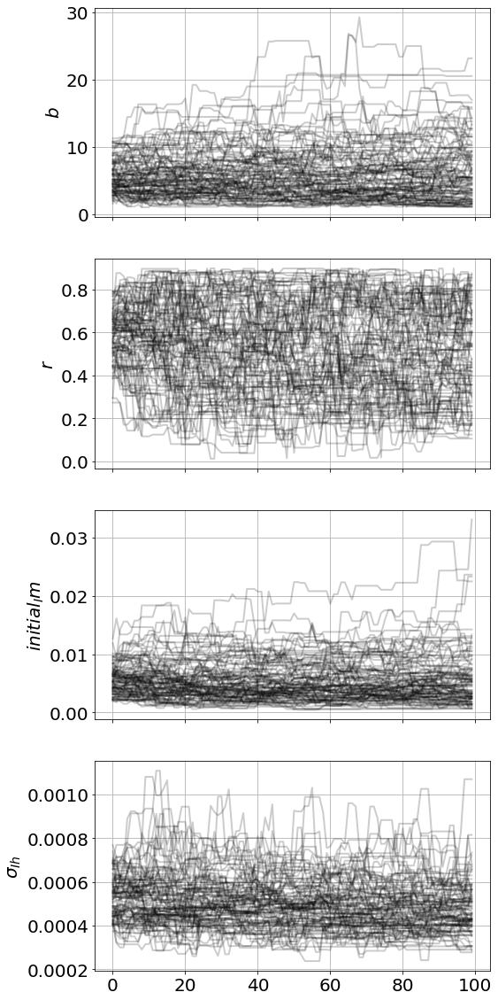

In [146]:
model.run_mcmc(100,repeat=4)
model.plot_chains()

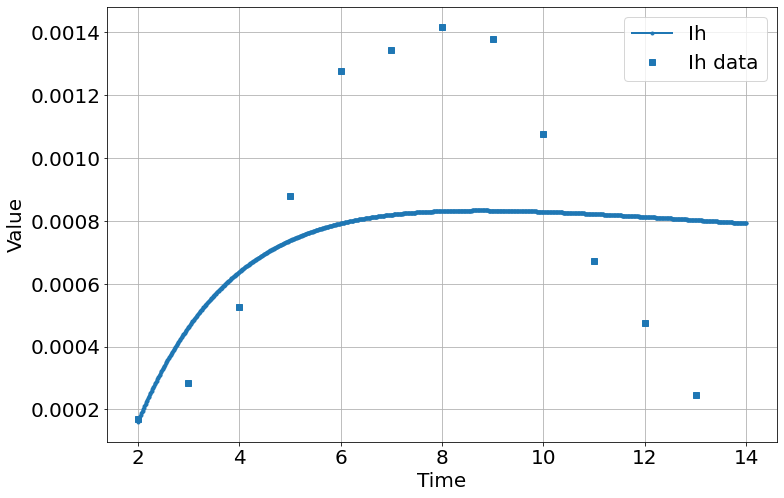

<Figure size 864x576 with 0 Axes>

In [147]:
sim.run(2,14)

# Peaks Fitting

In [231]:
from lmfit import *

In [232]:
model=models.GaussianModel()

In [233]:
model.param_names

['amplitude', 'center', 'sigma']

In [235]:
results=model.fit(y,x=x, amplitude=1.6, center=1.15, sigma=.5 )

In [236]:
results

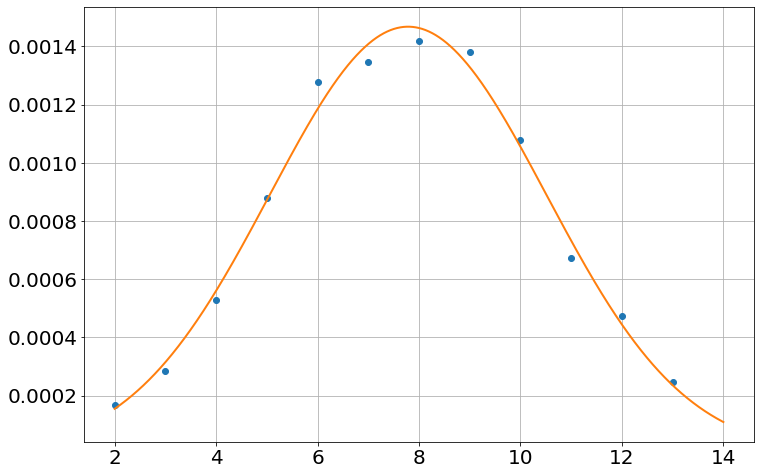

In [239]:
x_fake=linspace(2,14,2000)
y_fake=results.eval(x=x_fake)
plot(x,y,'o')
plot(x_fake, y_fake, '-')

In [240]:
results.var_names

['amplitude', 'center', 'sigma']

In [241]:
results.params['amplitude'].value

0.01003297261327423

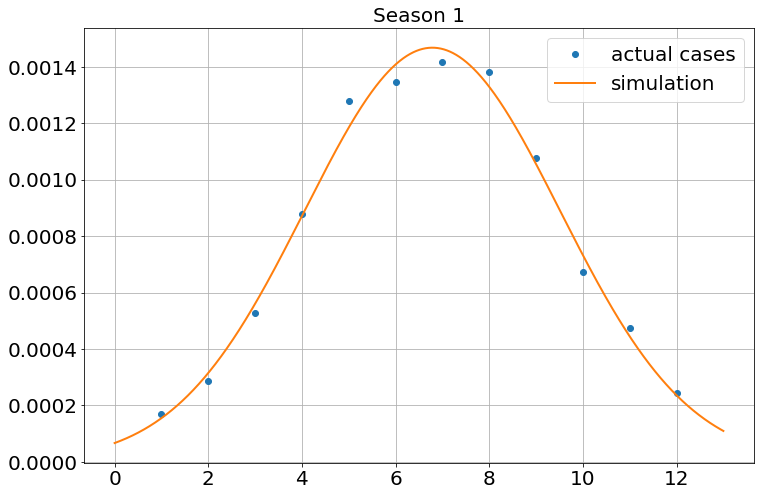

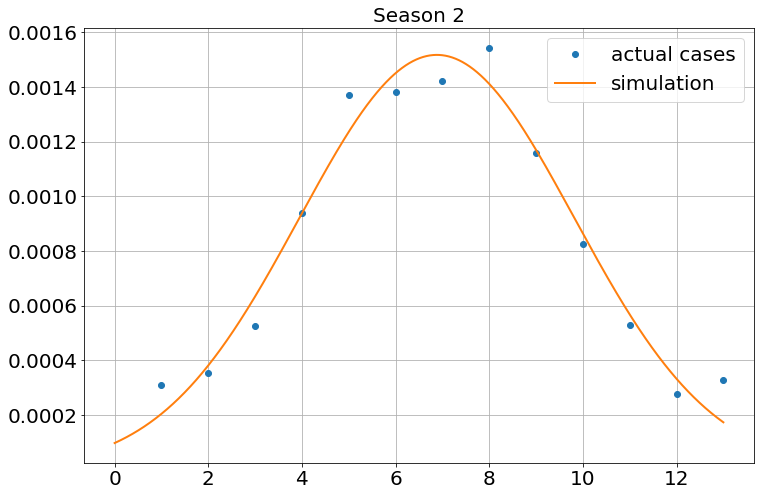

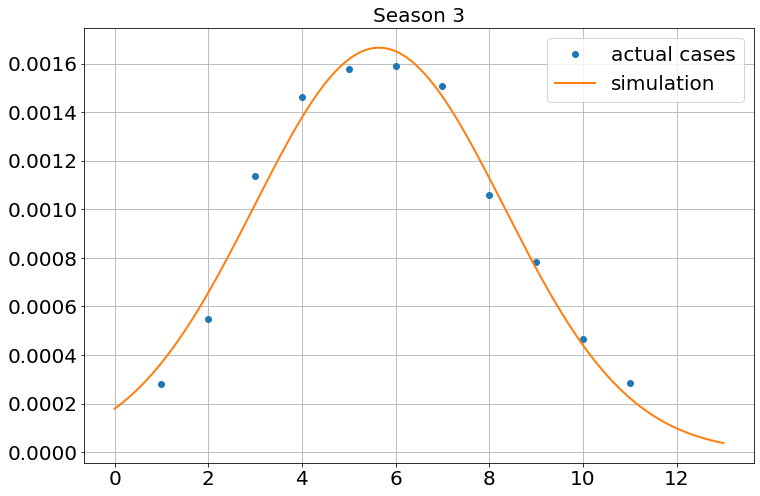

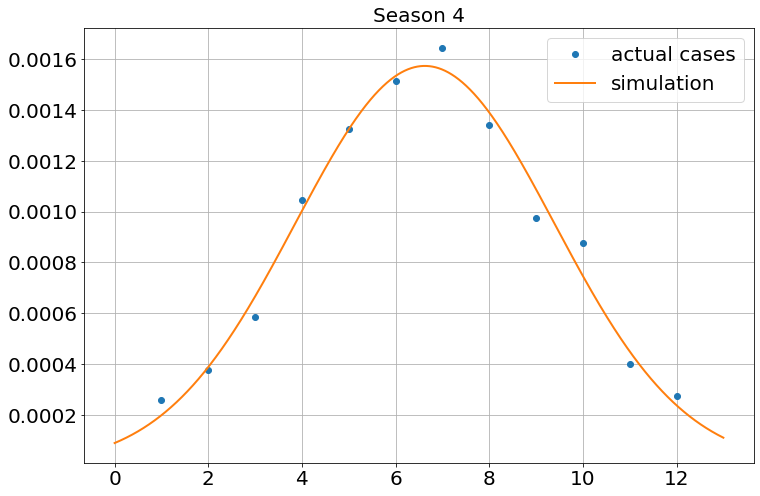

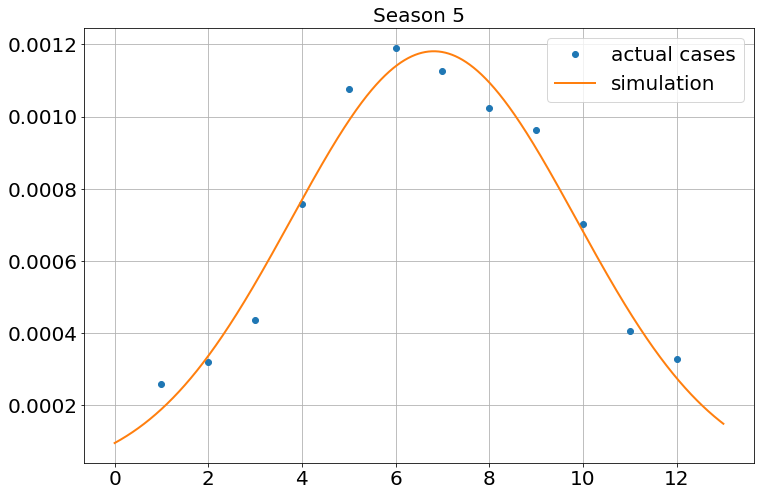

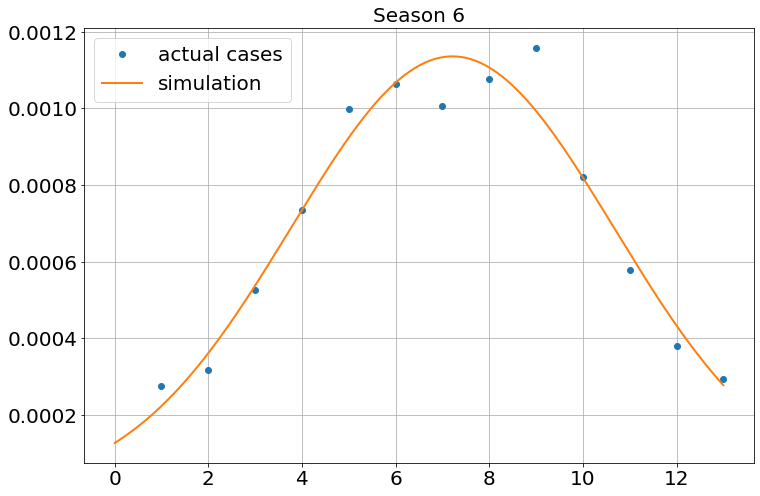

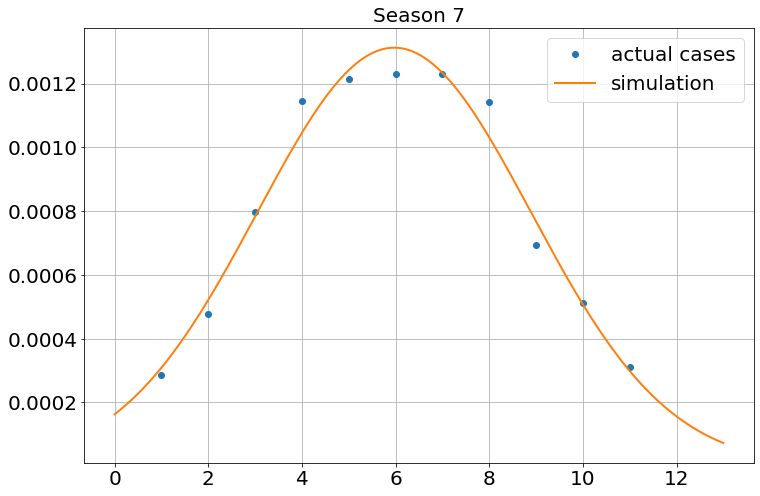

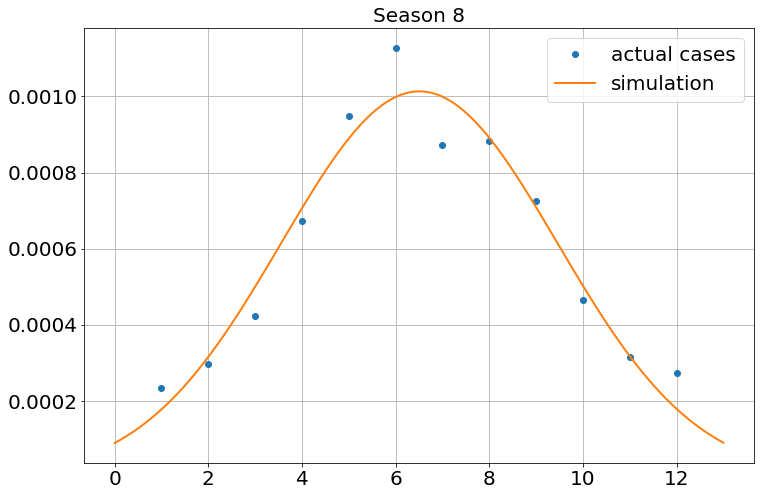

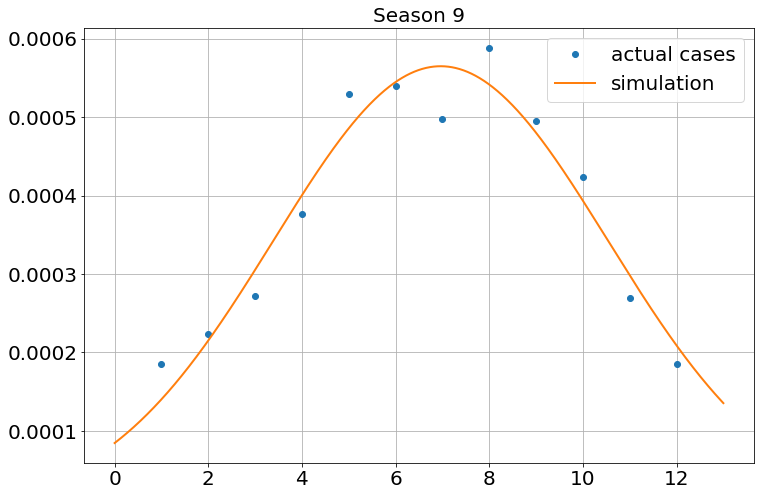

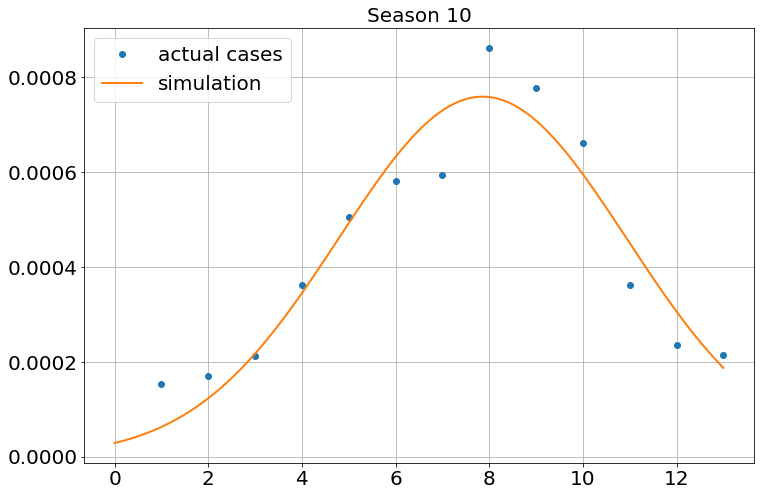

In [244]:
for i in range(1,11):
    x = dfs[i].index_col
    y = dfs[i].m_fraction
    
    model=models.GaussianModel()
    results=model.fit(y,x=x, amplitude=1.6, center=1.15, sigma=.5 )

    figure()
    x_fake=linspace(0,13,2000)
    y_fake=results.eval(x=x_fake)
    plot(x,y,'o', label = 'actual cases')
    plot(x_fake, y_fake, '-', label = 'simulation')
    
    title(f'Season {i}')
    legend()

In [245]:
model?

Type:           GaussianModel
String form:    <lmfit.Model: Model(gaussian)>
File:           c:\users\student\anaconda3\lib\site-packages\lmfit\models.py
Docstring:     
A model based on a Gaussian or normal distribution lineshape.

The model has three Parameters: `amplitude`, `center`, and `sigma`.
In addition, parameters `fwhm` and `height` are included as
constraints to report full width at half maximum and maximum peak
height, respectively.

.. math::

    f(x; A, \mu, \sigma) = \frac{A}{\sigma\sqrt{2\pi}} e^{[{-{(x-\mu)^2}/{{2\sigma}^2}}]}

where the parameter `amplitude` corresponds to :math:`A`, `center` to
:math:`\mu`, and `sigma` to :math:`\sigma`. The full width at half
maximum is :math:`2\sigma\sqrt{2\ln{2}}`, approximately
:math:`2.3548\sigma`.

For more information, see: https://en.wikipedia.org/wiki/Normal_distribution
Init docstring:
Parameters
----------
independent_vars : :obj:`list` of :obj:`str`, optional
    Arguments to the model function that are independent varia

$$f(x; A, \mu, \sigma) = \frac{A}{\sigma\sqrt{2\pi}} e^{[{-{(x-\mu)^2}/{{2\sigma}^2}}]}$$